# Worker Productivity Analysis--Part 1

For Garment Industry workerer productivity is the key.Any bottle-neck in the prodcution line can decrease the overall output.
Hence understanding the factors which affect worker's productivity is of prime importance for the decision makers.In this blog we will look at one such case study and we will see how machine learning helps in predicitng workers productivity, We will also look at various factors which effects this productivity.

<br><b>Case Study -</b></br>
The Garment Industry is one of the key examples of the industrial globalization of this modern era. It is a highly labour-intensive industry with lots of manual processes. Satisfying the huge global demand for garment products is mostly dependent on the production and delivery performance of the employees in the garment manufacturing companies. So, it is highly desirable among the decision makers in the garments industry to track, analyse and predict the productivity performance of the working teams in their factories

<b>Data Defination</b>

<b>Data-</b>(https://www.kaggle.com/datasets/ishadss/productivity-prediction-of-garment-employees)<br>
1 date : Date in MM-DD-YYYY<br>
2 day : Day of the Week<br>
3 quarter : A portion of the month. A month was divided into four quarters<br>
4 department : Associated department with the instance<br>
5 teamno : Associated team number with the instance<br>
6 noofworkers : Number of workers in each team <br>
7 noofstylechange : Number of changes in the style of a particular product<br>
8 targetedproductivity : Targeted productivity set by the Authority for each team for each day. <br>
9 smv : Standard Minute Value, it is the allocated time for a task <br>
10 wip : Work in progress. Includes the number of unfinished items for products <br>
11 overtime : Represents the amount of overtime by each team in minutes<br>
12 incentive : Represents the amount of financial incentive (in BDT) that enables or motivates a particular course of action.<br>
13 idletime : The amount of time when the production was interrupted due to several reasons<br> 
14 idlemen : The number of workers who were idle due to production interruption<br>
15 actual_productivity : The actual % of productivity that was delivered by the workers. It ranges from 0-1.(target)<br>

<b>Objective - </b><br>
1. The objective of this exercise is to create an regression model to predict the actual_productivity.<br>
2. Gather actionable insight from Garment data to improve productivity

In this blog we will cover all regression models. We will also look behind the scenes how this ML algorithm works.
<br><b>Topics -</b><br>
1. EDA<br>
2. Multicollinearity & Missing Value<br>
3. Scaling<br>
4. Linear Models<br>
    a. Logistic regression<br>
    b. Polynomial regression<br>
    c. Lasso,ridge,elastic.net<br>
    d. SVM<br>
   e. Neural Network<br>
5. Tree Based Model<br>
    a.Decision Tree<br>
    b.Random Forest<br>
    c.Xboost<br>
    d.Adaboost<br>
6. AutoML<br>
7. Meta Learner<br>
8. Stacked Model
9. Combined Model<br>
10. Final Model Comparisson<br>
11.Conclussion<br>
12.Ref<br>

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import pgeocode as pg
import matplotlib.pyplot as plt
import seaborn as sn
import os
from pandas_profiling import ProfileReport
import pulp

C:\Users\ghoshr\Desktop\lib\site-packages\numpy\_distributor_init.py:32: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\ghoshr\Desktop\lib\site-packages\numpy\.libs\libopenblas.4SP5SUA7CBGXUEOC35YP2ASOICYYEQZZ.gfortran-win_amd64.dll
C:\Users\ghoshr\Desktop\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
  stacklevel=1)


In [2]:
master_data_df = pd.read_csv('garments_worker_productivity.csv')
master_data_df.memory_usage()

Index                     128
date                     9576
quarter                  9576
department               9576
day                      9576
team                     9576
targeted_productivity    9576
smv                      9576
wip                      9576
over_time                9576
incentive                9576
idle_time                9576
idle_men                 9576
no_of_style_change       9576
no_of_workers            9576
actual_productivity      9576
dtype: int64

# EDA

In [3]:
ProfileReport(master_data_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<b>Initial Finding</b>

1. We have 15 variables and 1197 observations.WIP is the only column with all missing variable
2. There are 2 distinct deparment,12 teams. Majority of cases there is no style change
3. Higher the targeted productivity and higher the actual productivity
4. Idle time is highly skewed
5. smv is correlated with over-time,incentive,no of style change,no of workers
6. actual productivity is correlated with targetted productivity
7. umber of worker is correlated with smv,over_time
8. Idle_time is correlated with idle men
9. No of style change is correlated with number of worker

In [4]:
master_data_df.head(6)

,date,quarter,department,day,team,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity
0,01/01/2015,Quarter1,sweing,Thursday,8,0.80,26.16,1108.0,7080,98,0.0,0,0,59.0,0.940725
1,01/01/2015,Quarter1,finishing,Thursday,1,0.75,3.94,NaN,960,0,0.0,0,0,8.0,0.886500
2,01/01/2015,Quarter1,sweing,Thursday,11,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570
3,01/01/2015,Quarter1,sweing,Thursday,12,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570
4,01/01/2015,Quarter1,sweing,Thursday,6,0.80,25.90,1170.0,1920,50,0.0,0,0,56.0,0.800382
5,01/01/2015,Quarter1,sweing,Thursday,7,0.80,25.90,984.0,6720,38,0.0,0,0,56.0,0.800125


<b>Treating Missing Values</b>

In [5]:
missing_value = master_data_df[master_data_df['wip'].isnull()]
missing_value.shape

(506, 15)

In [6]:
ProfileReport(missing_value)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
master_data_df['wip'].fillna(0,inplace=True)

In [8]:
writer = pd.ExcelWriter('EDA_EXCEL.xlsx', engine='xlsxwriter')

Since for finishing team wip doesnot make sense, we are replacing the wip for finishing deparnment to 0

### Basic Feature Engineering

Here we will do some basic feature engineering like creation of month and year

In [9]:
master_data_df['date'] = pd.to_datetime(master_data_df['date'])
master_data_df['month'] = master_data_df['date'].apply(lambda var :var.month)
master_data_df['year'] = master_data_df['date'].apply(lambda var :var.year)
dic = {1:'Jan',2:'Feb',3:'Mar',4:'Aprl',5:'May',6:'Jun',7:'Jul',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'}
master_data_df['month'] = master_data_df['month'].map(dic)
master_data_df["department"] = np.where(master_data_df["department"].str.contains("finis",regex=True),"finishing","seweing")
master_data_df["team_department"] = master_data_df["team"].astype('str')+'-'+master_data_df["department"].str[0:3]
master_data_df["meet_target"] = np.where(master_data_df['targeted_productivity']<master_data_df['actual_productivity'],"Yes","No")
master_data_df["actual_productivity_type"] =master_data_df["actual_productivity"].apply(lambda var: "Low" if var <0.65 else("Mid" if var < 0.8 else "High"))

In [10]:
master_data_df.head(2)

,date,quarter,department,day,team,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity,month,year,team_department,meet_target,actual_productivity_type
0,2015-01-01,Quarter1,seweing,Thursday,8,0.80,26.16,1108.0,7080,98,0.0,0,0,59.0,0.940725,Jan,2015,8-sew,Yes,High
1,2015-01-01,Quarter1,finishing,Thursday,1,0.75,3.94,0.0,960,0,0.0,0,0,8.0,0.886500,Jan,2015,1-fin,Yes,High


### Exploratory Data Analysis

C:\Users\ghoshr\Desktop\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0, 0.5, 'count')

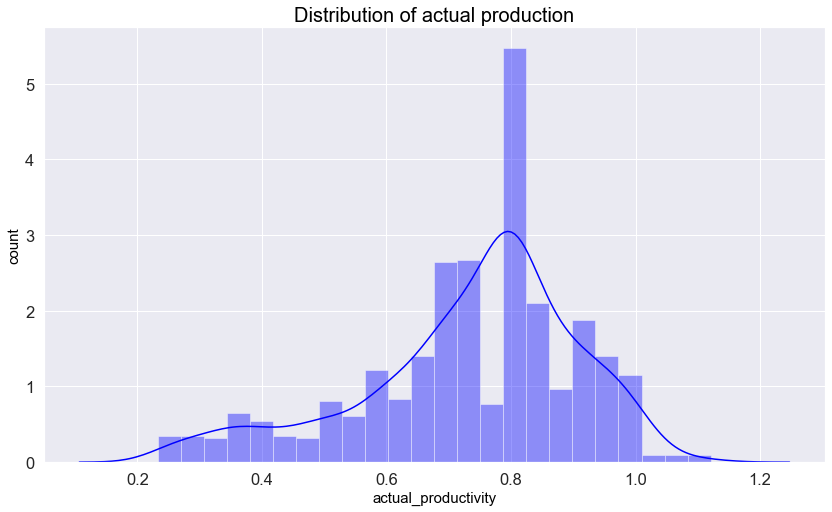

In [11]:
sn.set_theme(style='dark')
sn.set(font_scale=1.5)
plt.figure(figsize=(14,8))
sn.distplot(master_data_df['actual_productivity'],color="blue")
plt.title("Distribution of actual production",fontsize=20, color='black')
plt.xlabel("actual_productivity",fontsize=15, color='black')
plt.ylabel("count",fontsize=15, color='black')

### pair plot

Index(['date', 'quarter', 'department', 'day', 'team', 'targeted_productivity',
       'smv', 'wip', 'over_time', 'incentive', 'idle_time', 'idle_men',
       'no_of_style_change', 'no_of_workers', 'actual_productivity', 'month',
       'year', 'team_department', 'meet_target', 'actual_productivity_type'],
      dtype='object')


<Figure size 1080x1080 with 0 Axes>

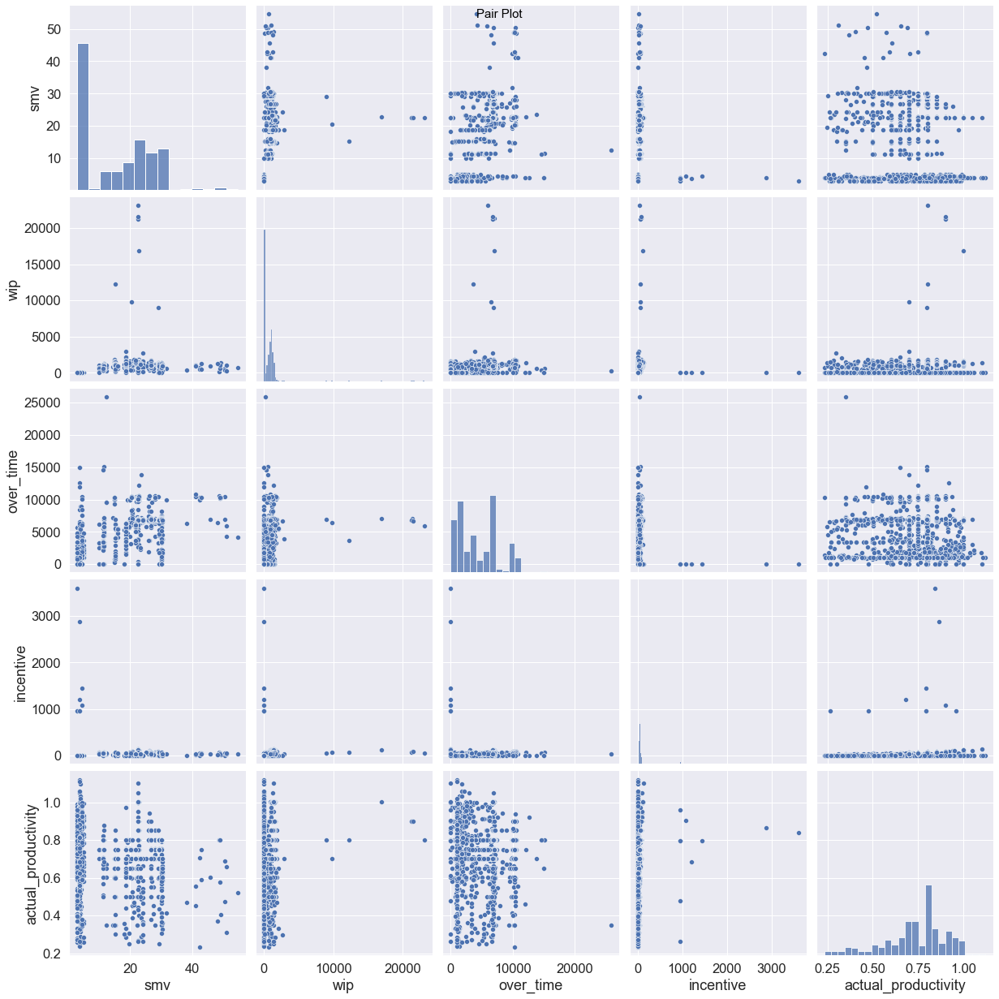

In [12]:
cat_data = master_data_df[[
       'smv', 'wip', 'over_time','incentive','actual_productivity']]
plt.figure(figsize=(15,15))
g = sn.pairplot(cat_data,height=3.5)
g.fig.suptitle("Pair Plot",fontsize=15, color='black')
print(master_data_df.columns)

Index(['date', 'quarter', 'department', 'day', 'team', 'targeted_productivity',
       'smv', 'wip', 'over_time', 'incentive', 'idle_time', 'idle_men',
       'no_of_style_change', 'no_of_workers', 'actual_productivity', 'month',
       'year', 'team_department', 'meet_target', 'actual_productivity_type'],
      dtype='object')


<Figure size 1080x1080 with 0 Axes>

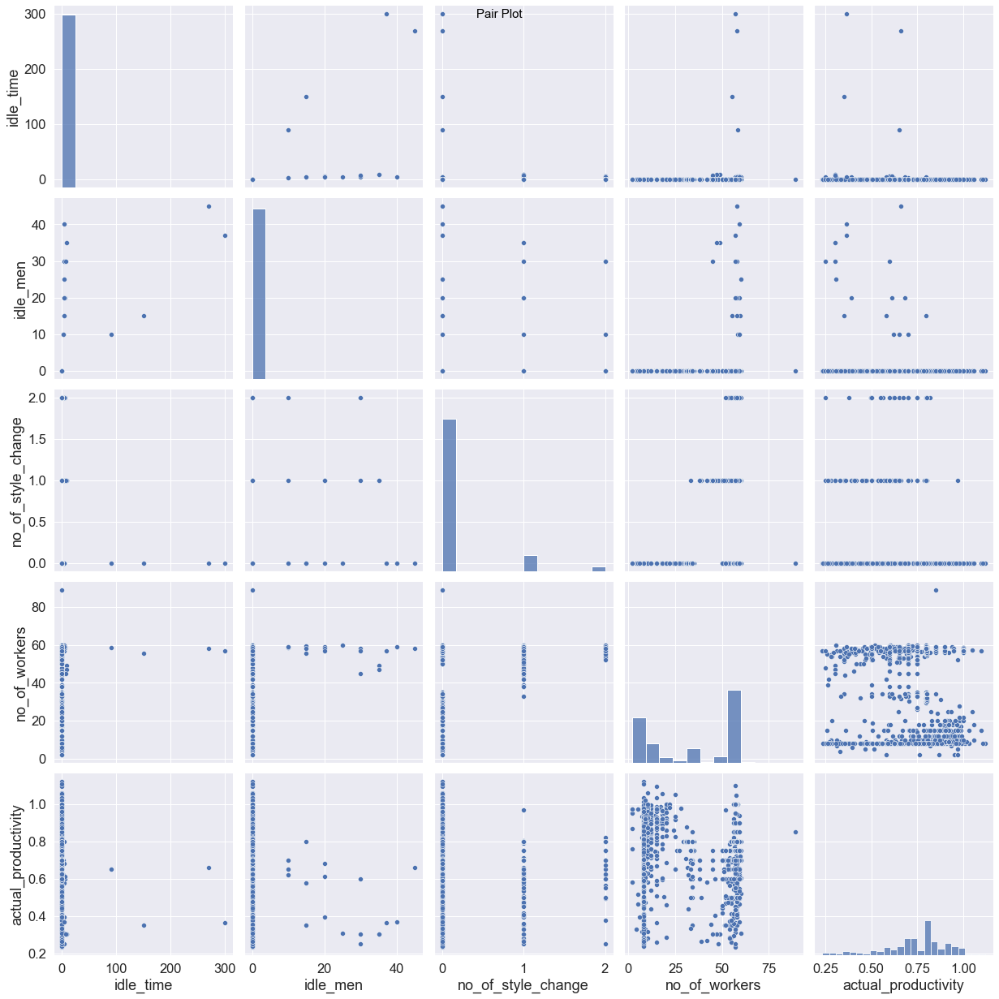

In [13]:
cat_data = master_data_df[[
      'idle_time', 'idle_men',
       'no_of_style_change', 'no_of_workers','actual_productivity']]
plt.figure(figsize=(15,15))
g = sn.pairplot(cat_data,height=3.5)
g.fig.suptitle("Pair Plot",fontsize=15, color='black')
print(master_data_df.columns)

Text(0.5, 1.0, 'Correlation Map')

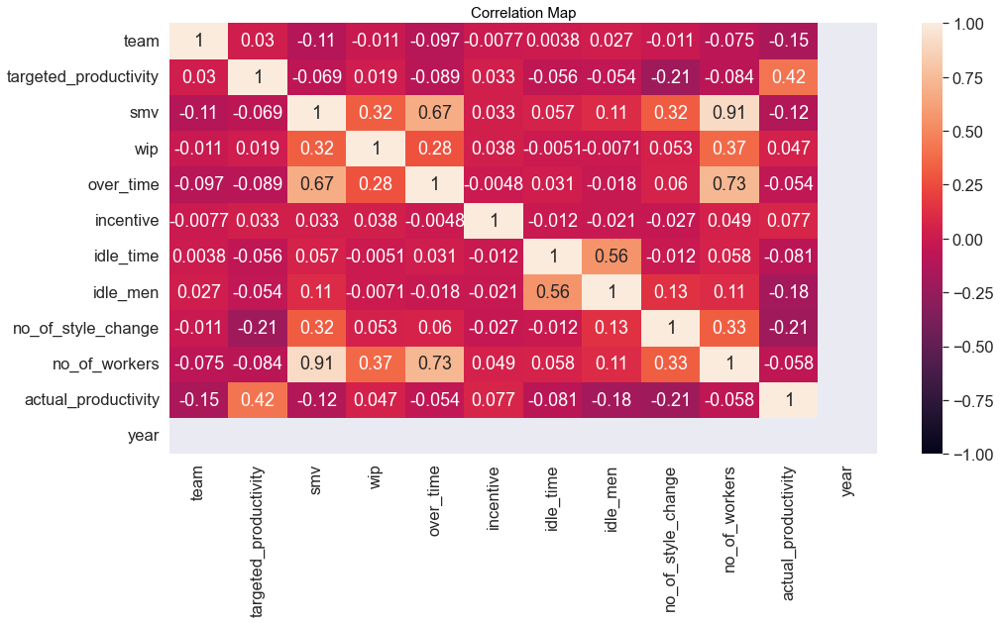

In [14]:
#Correlation Metrics
plt.figure(figsize=(16,8))
corr = master_data_df.corr()
sn.heatmap(corr,vmin=-1, vmax=1, annot=True)
plt.title("Correlation Map",fontsize=15,color="black")

<b>Analysis by time Target vs actual</b>

Text(0, 0.5, 'Actual Productivity')

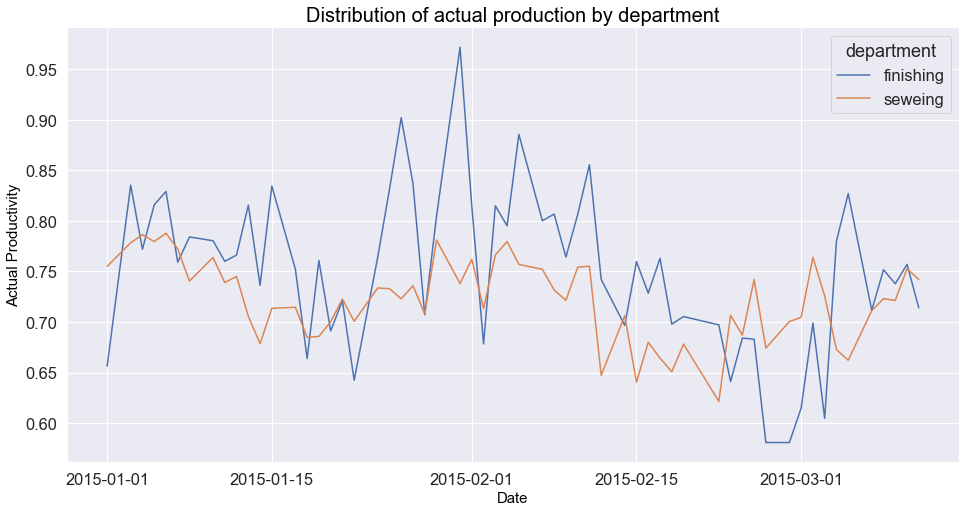

In [15]:
plt.figure(figsize=(16,8))
temp = master_data_df.groupby(["date","department"],as_index=False).agg(targeted_productivity = ('targeted_productivity','mean'),actual_productivity = ('actual_productivity','mean'))
temp = temp.sort_values(by="date")
sn.lineplot(x="date",y="actual_productivity",data=temp,hue="department")
plt.title("Distribution of actual production by department",fontsize=20, color='black')
plt.xlabel("Date",fontsize=15, color='black')
plt.ylabel("Actual Productivity",fontsize=15, color='black')

Text(0, 0.5, 'Target Productivity')

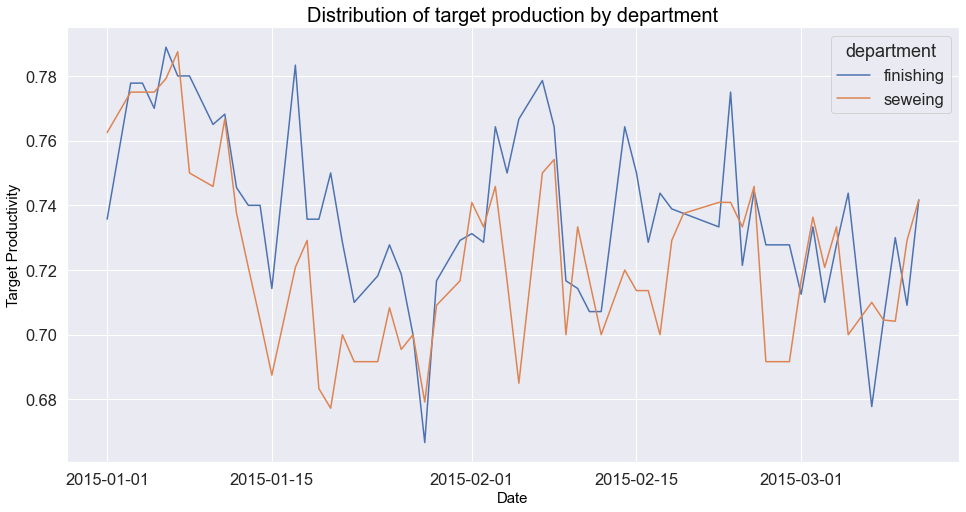

In [16]:
plt.figure(figsize=(16,8))
sn.lineplot(x="date",y="targeted_productivity",data=temp,hue="department")
plt.title("Distribution of target production by department",fontsize=20, color='black')
plt.xlabel("Date",fontsize=15, color='black')
plt.ylabel("Target Productivity",fontsize=15, color='black')

Text(0, 0.5, 'Target Productivity')

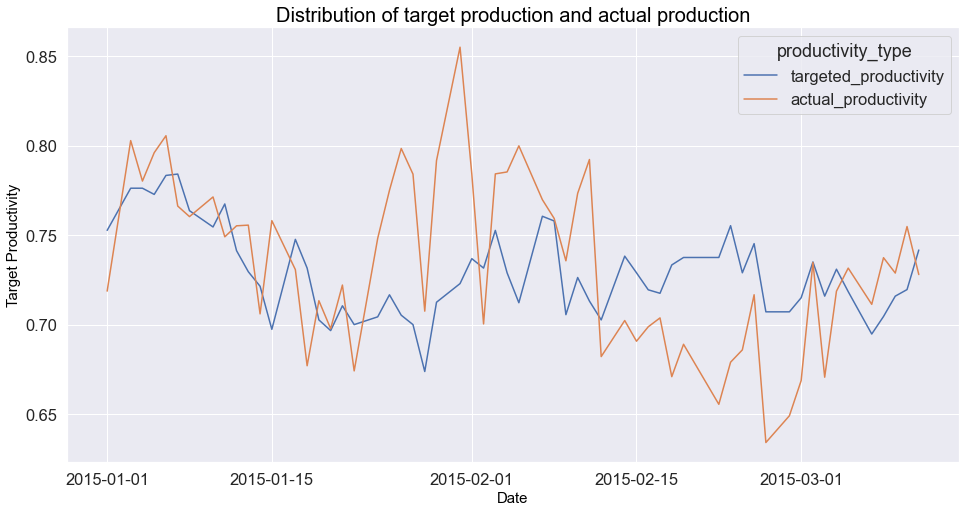

In [17]:
temp = master_data_df.groupby(["date"],as_index=False).agg(targeted_productivity = ('targeted_productivity','mean'),actual_productivity = ('actual_productivity','mean'))
temp = temp.sort_values(by="date")
temp = pd.melt(temp, id_vars=['date'], value_vars=['targeted_productivity', 'actual_productivity'])
temp.columns = ["date","productivity_type","productivity"]
plt.figure(figsize=(16,8))
sn.lineplot(x="date",y="productivity",data=temp,hue="productivity_type")
plt.title("Distribution of target production and actual production",fontsize=20, color='black')
plt.xlabel("Date",fontsize=15, color='black')
plt.ylabel("Target Productivity",fontsize=15, color='black')

In [18]:
master_data_df.columns

Index(['date', 'quarter', 'department', 'day', 'team', 'targeted_productivity',
       'smv', 'wip', 'over_time', 'incentive', 'idle_time', 'idle_men',
       'no_of_style_change', 'no_of_workers', 'actual_productivity', 'month',
       'year', 'team_department', 'meet_target', 'actual_productivity_type'],
      dtype='object')

Text(0.5, 0, 'team_department')

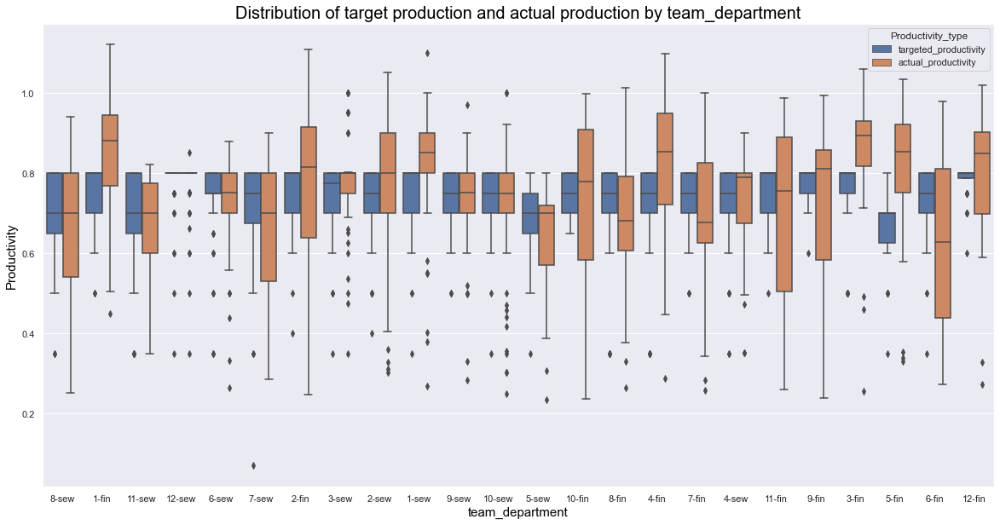

In [19]:
#Team vs Department
sn.set(font_scale=1.0)
temp = master_data_df[["team_department",'targeted_productivity','actual_productivity']]
temp = pd.melt(temp, id_vars=["team_department"], value_vars=['targeted_productivity', 'actual_productivity'])
temp.columns = ['team_department','Productivity_type','Productivity']
plt.figure(figsize=(20,10))
sn.boxplot(x="team_department",y="Productivity",data=temp,hue="Productivity_type")
plt.title("Distribution of target production and actual production by team_department",fontsize=20, color='black')
plt.ylabel("Productivity",fontsize=15, color='black')
plt.xlabel("team_department",fontsize=15, color='black')

Day of Month

Text(0.5, 0, 'date')

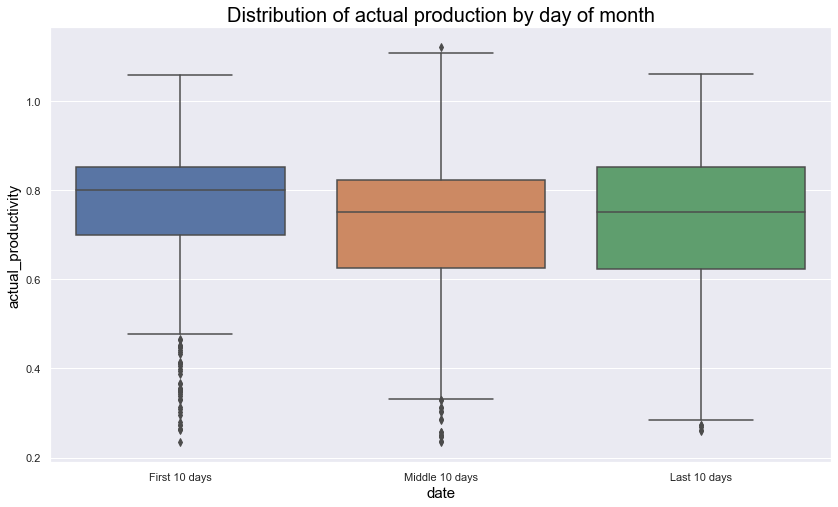

In [20]:
master_data_df['dayofmonth'] = master_data_df['date'].apply(lambda var :var.day)
master_data_df['dayofmonth'] = master_data_df['dayofmonth'].apply(lambda var: "First 10 days" if var <11 else("Middle 10 days" if var < 20 else "Last 10 days"))
plt.figure(figsize=(14,8))
sn.boxplot(x="dayofmonth",y="actual_productivity",data=master_data_df)
plt.title("Distribution of actual production by day of month",fontsize=20, color='black')
plt.ylabel("actual_productivity",fontsize=15, color='black')
plt.xlabel("date",fontsize=15, color='black')

Text(0.5, 0, 'Day of Month')

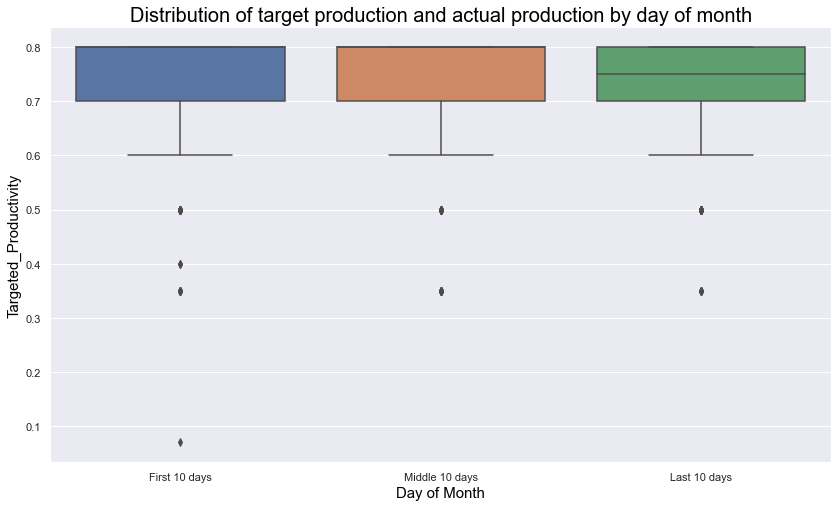

In [21]:
plt.figure(figsize=(14,8))
sn.boxplot(x="dayofmonth",y="targeted_productivity",data=master_data_df)
plt.title("Distribution of target production and actual production by day of month",fontsize=20, color='black')
plt.ylabel("Targeted_Productivity",fontsize=15, color='black')
plt.xlabel("Day of Month",fontsize=15, color='black')

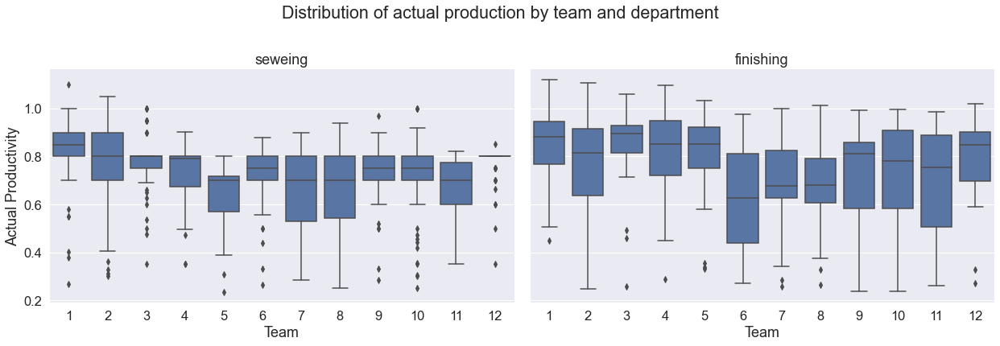

In [22]:
sn.set(font_scale=1.5)
graph = sn.FacetGrid(master_data_df,col="department", height=5.5, aspect=1.6)
graph.map_dataframe(sn.boxplot,x="team",y="actual_productivity")
graph.fig.subplots_adjust(top=0.9)
graph.set_titles(col_template = '{col_name}')
graph.set_axis_labels(x_var="Team", y_var="Actual Productivity")
graph.fig.suptitle('Distribution of actual production by team and department',y=1.10)
plt.show()

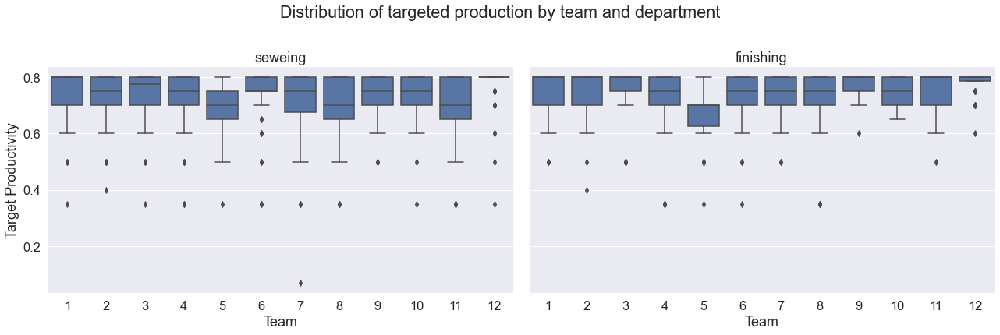

In [23]:
sn.set(font_scale=1.5)
graph = sn.FacetGrid(master_data_df,col="department",height=5.5, aspect=1.65)
graph.map_dataframe(sn.boxplot,x="team",y="targeted_productivity")
graph.fig.subplots_adjust(top=0.9)
graph.set_titles(col_template = '{col_name}')
graph.set_axis_labels(x_var="Team", y_var="Target Productivity")
graph.fig.suptitle('Distribution of targeted production by team and department',y=1.10)
plt.show()

Text(0.5, 0, 'Day of Week')

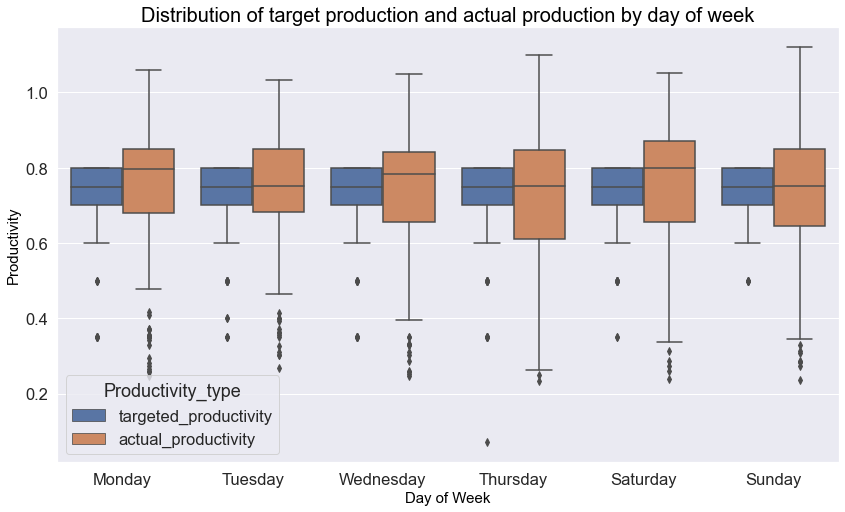

In [24]:
temp = master_data_df[["day",'targeted_productivity','actual_productivity']]
temp = pd.melt(temp, id_vars=["day"], value_vars=['targeted_productivity', 'actual_productivity'])
temp.columns = ['Day Of Week','Productivity_type','Productivity']
plt.figure(figsize=(14,8))
sn.boxplot(x="Day Of Week",y="Productivity",data=temp,hue="Productivity_type",order= ["Monday","Tuesday","Wednesday","Thursday","Saturday","Sunday"])
plt.title("Distribution of target production and actual production by day of week",fontsize=20, color='black')
plt.ylabel("Productivity",fontsize=15, color='black')
plt.xlabel("Day of Week",fontsize=15, color='black')

Observation 
1. First 10 days of the month have higher productivity compared to middle and last days of the month
2. Ceratin teams in sewing and finishing performs higher than target
3. In Saturday,Monday and Wednesday we have higher actual productivity than target
4. Finishing have higher productivity than seweing
5. Higher target productivity leads to higher actual productivity

<b>Analysis by time wip by team</b>

C:\Users\ghoshr\Desktop\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distribution of WIP')

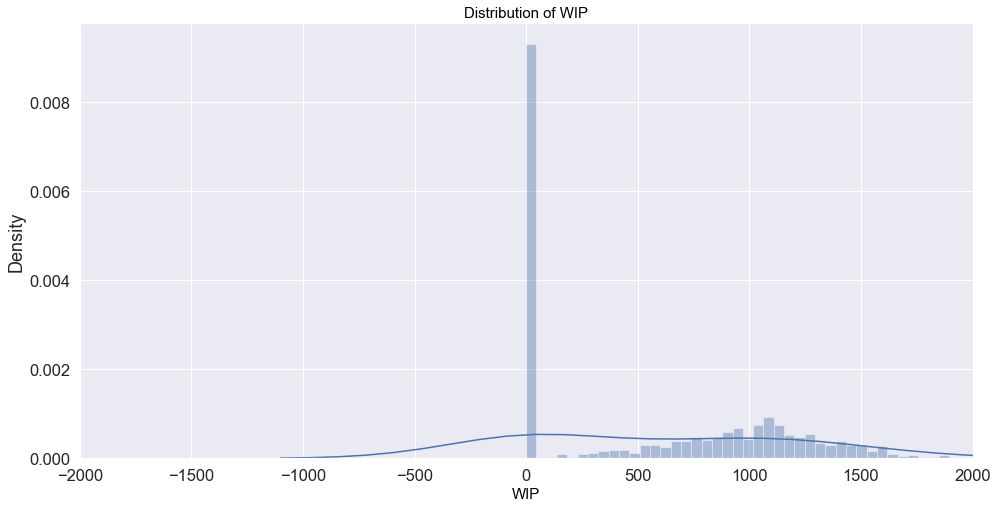

In [25]:
plt.figure(figsize=(16,8))
sn.distplot(master_data_df['wip'],bins=500)
plt.xlim(-2000,2000)
plt.xlabel("WIP",fontsize=15, color='black')
plt.title("Distribution of WIP",fontsize=15, color='black')

Text(0.5, 1.0, 'Distribution Of WIP')

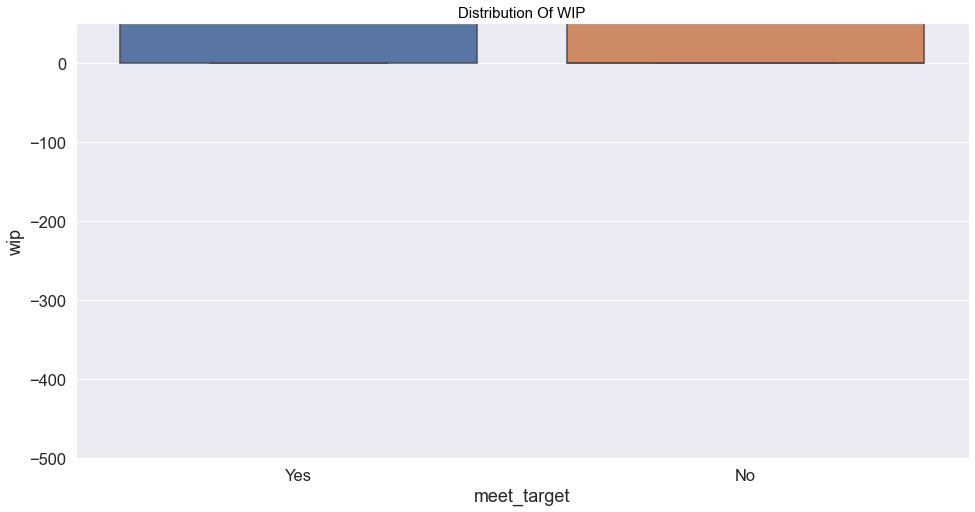

In [26]:
plt.figure(figsize=(16,8))
sn.boxplot(x="meet_target",y="wip",data=master_data_df)
plt.ylim(-500,50)
plt.title("Distribution Of WIP",fontsize=15, color='black')

Text(0.5, 1.0, 'Distribution of WIP by actual productivity')

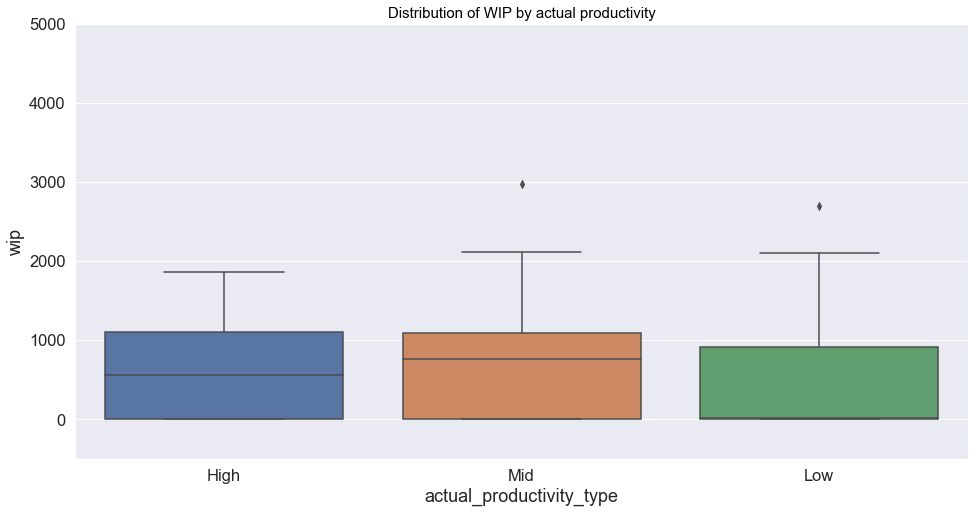

In [27]:
#actual_productivity_type
plt.figure(figsize=(16,8))
sn.boxplot(x="actual_productivity_type",y="wip",data=master_data_df)
plt.ylim(-500,5000)
plt.title("Distribution of WIP by actual productivity",fontsize=15, color='black')

Text(0.5, 1.0, 'Distribution of WIP by day')

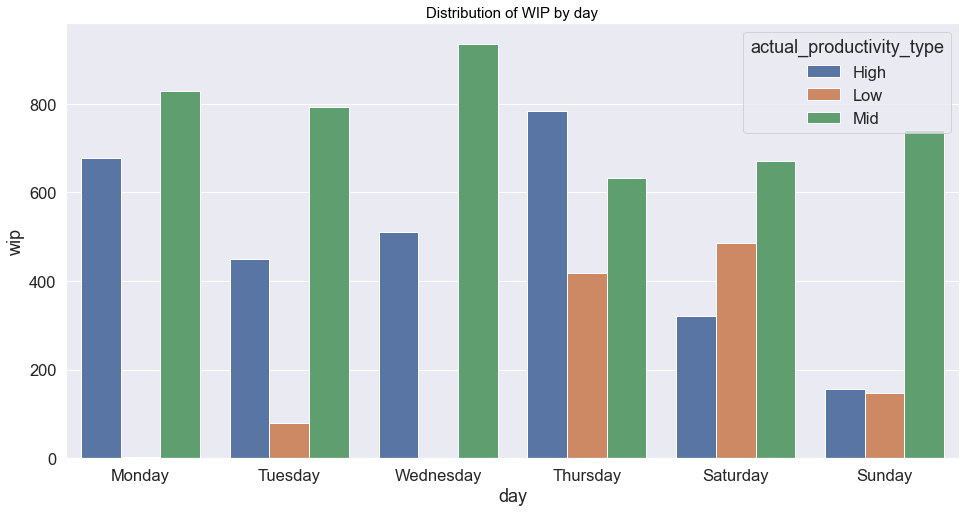

In [28]:
temp= master_data_df.groupby(["actual_productivity_type","day"],as_index=False).agg(wip = ('wip','median'))
plt.figure(figsize=(16,8))
sn.barplot(x="day",y="wip",data=temp,order=["Monday","Tuesday","Wednesday","Thursday","Saturday","Sunday"],hue="actual_productivity_type")
plt.title("Distribution of WIP by day",fontsize=15, color='black')

Text(0.5, 1.0, 'Distribution of WIP by team')

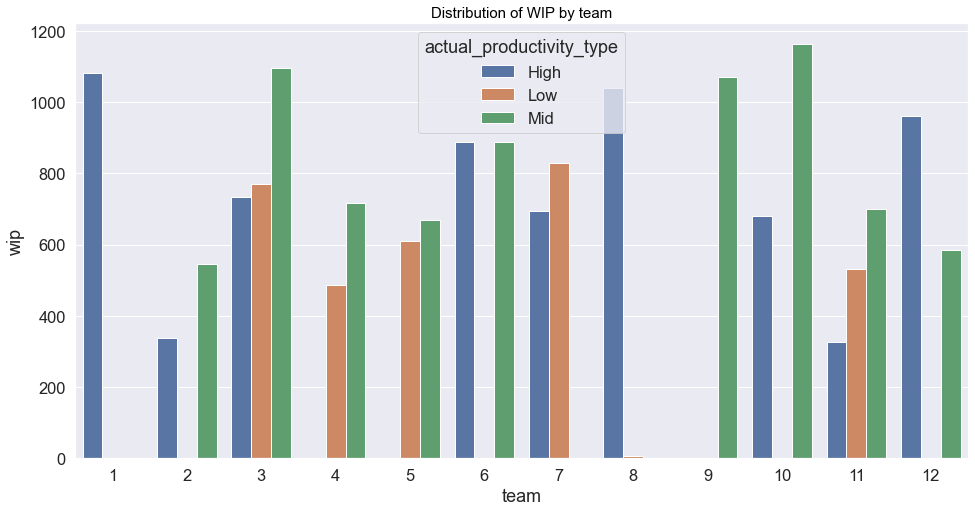

In [29]:
temp= master_data_df.groupby(["actual_productivity_type","team"],as_index=False).agg(wip = ('wip','median'))
plt.figure(figsize=(16,8))
sn.barplot(x="team",y="wip",data=temp,hue="actual_productivity_type")
plt.title("Distribution of WIP by team",fontsize=15, color='black')

Text(0.5, 0, 'team_department')

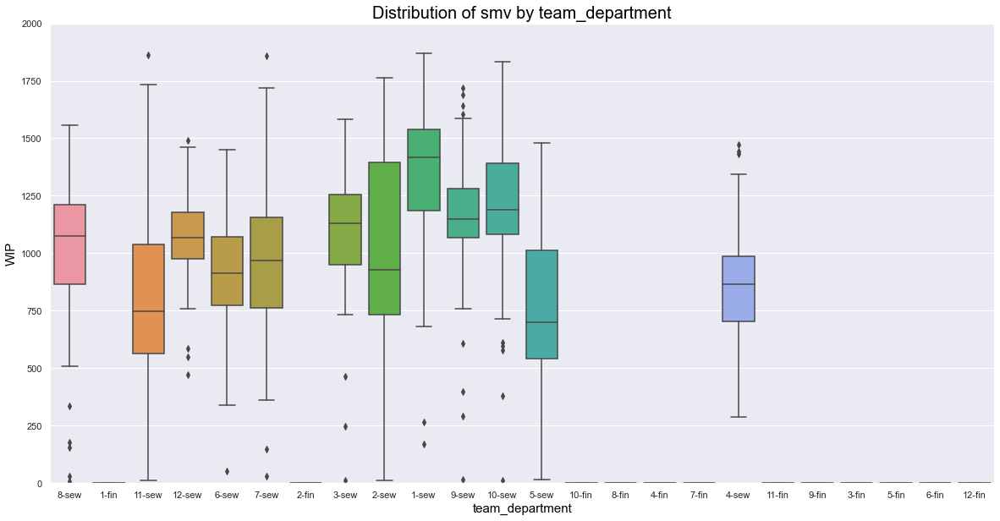

In [30]:
sn.set(font_scale=1.0)
temp = master_data_df[["team_department",'wip']]
plt.figure(figsize=(20,10))
sn.boxplot(x="team_department",y="wip",data=temp)
plt.title("Distribution of smv by team_department",fontsize=20, color='black')
plt.ylabel("WIP",fontsize=15, color='black')
plt.ylim(0,2000)
plt.xlabel("team_department",fontsize=15, color='black')

Text(0.5, 0, 'Day')

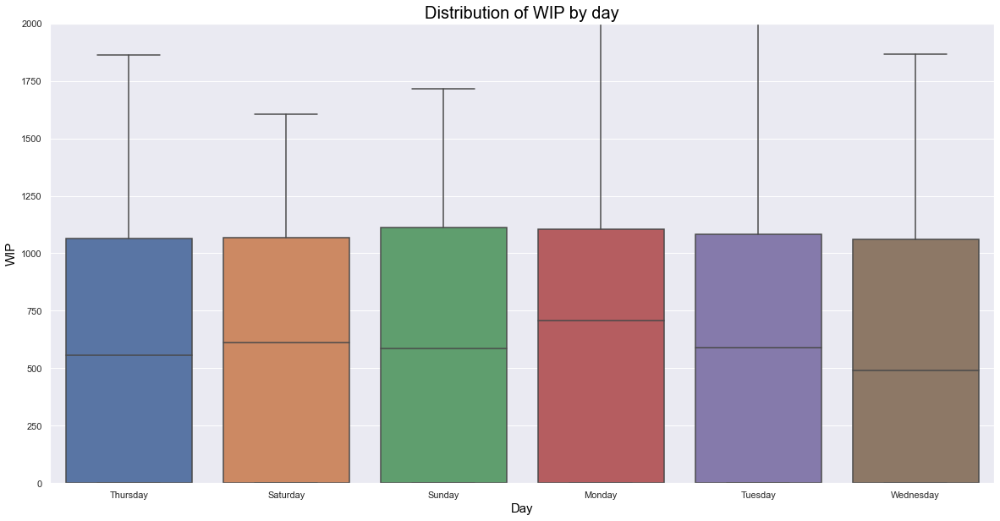

In [31]:
sn.set(font_scale=1.0)
temp = master_data_df[["day",'wip']]
plt.figure(figsize=(20,10))
sn.boxplot(x="day",y="wip",data=temp)
plt.title("Distribution of WIP by day",fontsize=20, color='black')
plt.ylabel("WIP",fontsize=15, color='black')
plt.ylim(0,2000)
plt.xlabel("Day",fontsize=15, color='black')

Text(0.5, 0, 'dayofmonth')

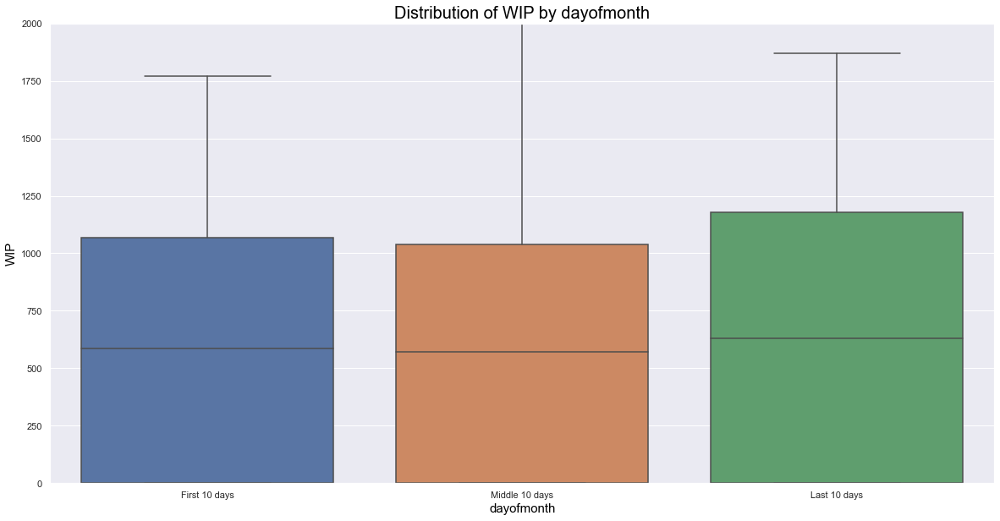

In [32]:
#dayofmonth
sn.set(font_scale=1.0)
temp = master_data_df[["dayofmonth",'wip']]
plt.figure(figsize=(20,10))
sn.boxplot(x="dayofmonth",y="wip",data=temp)
plt.title("Distribution of WIP by dayofmonth",fontsize=20, color='black')
plt.ylabel("WIP",fontsize=15, color='black')
plt.ylim(0,2000)
plt.xlabel("dayofmonth",fontsize=15, color='black')

<b>Analysis by time number of worker by team</b>

Text(0.5, 1.0, 'Distribution of No_of_workers by over_time')

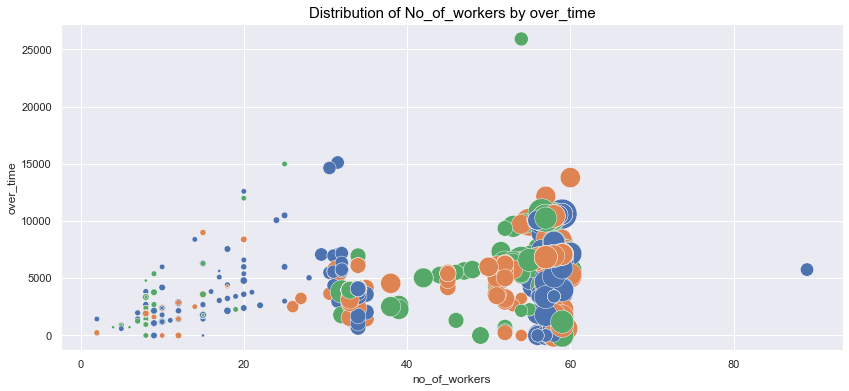

In [33]:
plt.figure(figsize=(14,6))
sn.scatterplot(x="no_of_workers",y="over_time",data=master_data_df,hue="actual_productivity_type",size="smv", legend=False, sizes=(10, 1000))
plt.title("Distribution of No_of_workers by over_time",fontsize=15, color='black')

Text(0.5, 1.0, 'Correlation Map')

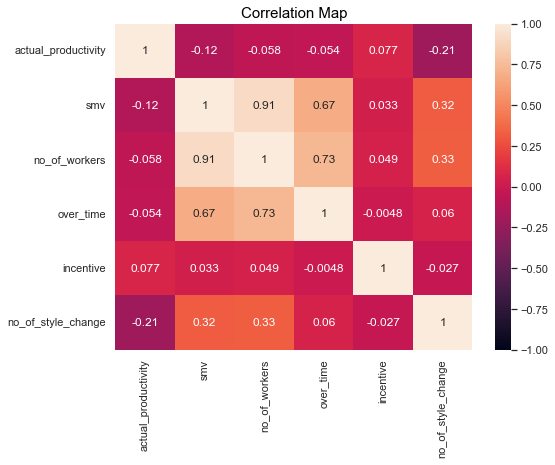

In [34]:
temp = master_data_df[['actual_productivity','smv','no_of_workers','over_time','incentive','no_of_style_change']]
plt.figure(figsize=(8,6))
corr = temp.corr()
sn.heatmap(corr,vmin=-1, vmax=1, annot=True)
plt.title("Correlation Map",fontsize=15,color="black")

Text(0.5, 1.0, 'Correlation Map')

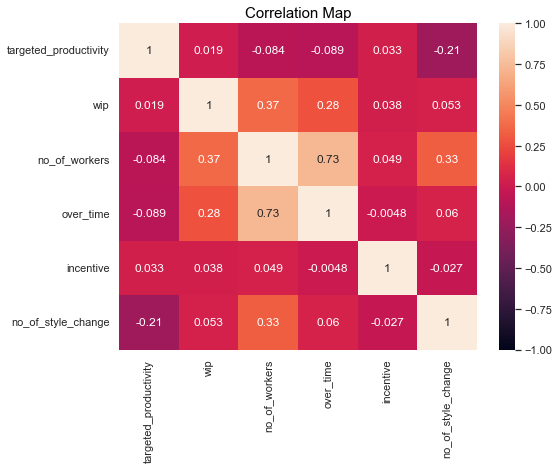

In [35]:
temp = master_data_df[['targeted_productivity','wip','no_of_workers','over_time','incentive','no_of_style_change']]
plt.figure(figsize=(8,6))
corr = temp.corr()
sn.heatmap(corr,vmin=-1, vmax=1, annot=True)
plt.title("Correlation Map",fontsize=15,color="black")

Text(0.5, 0, 'team_department')

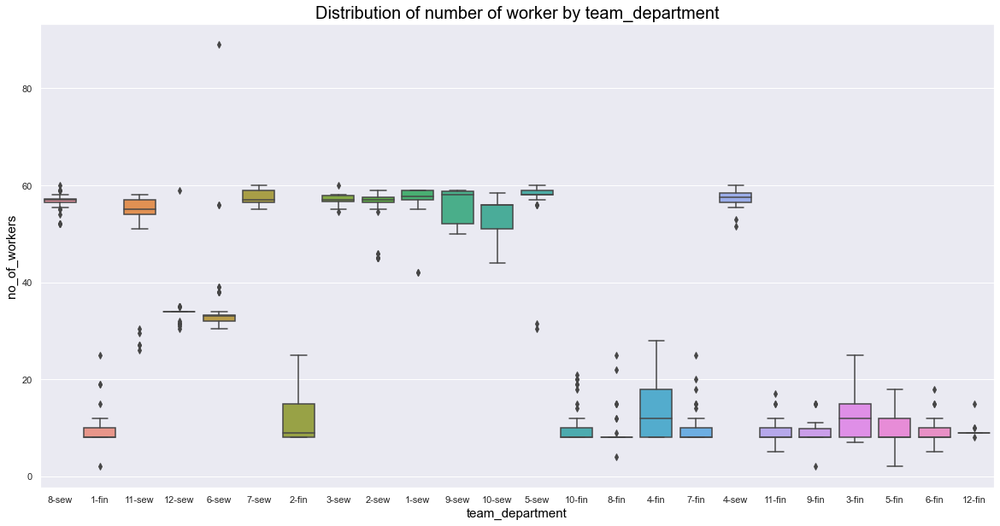

In [36]:
sn.set(font_scale=1.0)
temp = master_data_df[["team_department",'no_of_workers']]
plt.figure(figsize=(20,10))
sn.boxplot(x="team_department",y="no_of_workers",data=temp)
plt.title("Distribution of number of worker by team_department",fontsize=20, color='black')
plt.ylabel("no_of_workers",fontsize=15, color='black')
plt.xlabel("team_department",fontsize=15, color='black')

Text(0.5, 1.0, 'Distribution of No_of_workers by productivity')

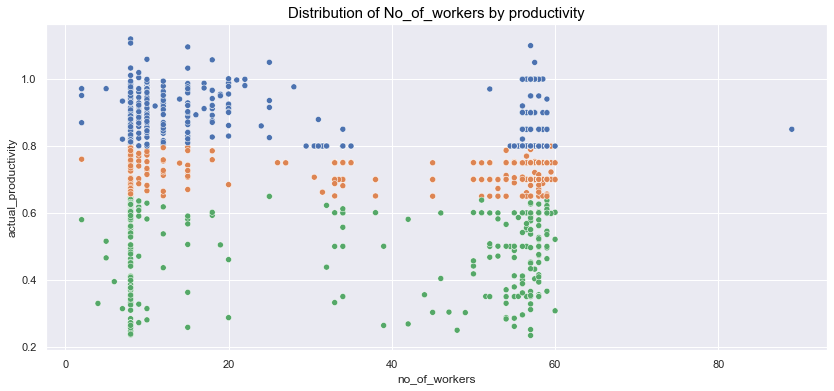

In [37]:
plt.figure(figsize=(14,6))
sn.scatterplot(x="no_of_workers",y="actual_productivity",data=master_data_df,hue="actual_productivity_type",legend=False, sizes=(10, 1000))
plt.title("Distribution of No_of_workers by productivity",fontsize=15, color='black')

Text(0.5, 0, 'dayofmonth')

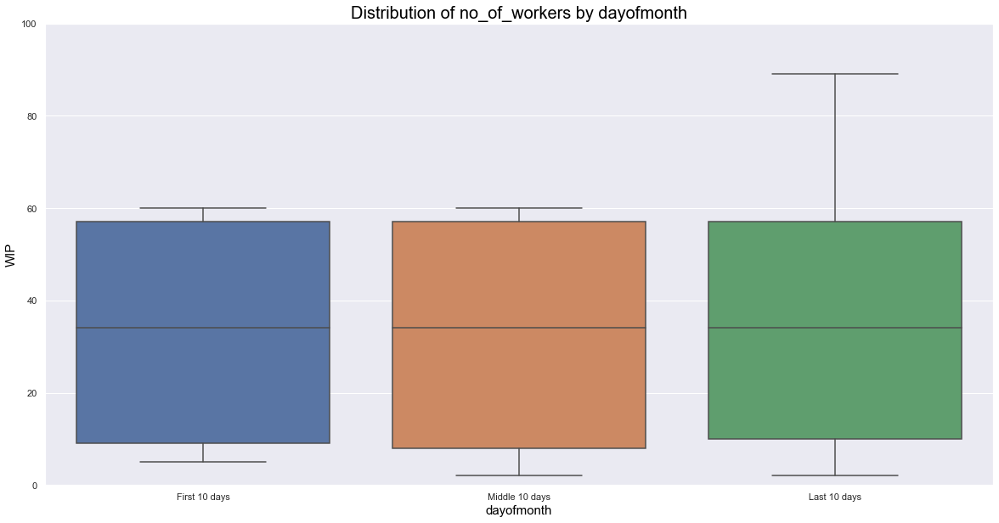

In [38]:
#dayofmonth
sn.set(font_scale=1.0)
temp = master_data_df[["no_of_workers",'dayofmonth']]
plt.figure(figsize=(20,10))
sn.boxplot(x="dayofmonth",y="no_of_workers",data=temp)
plt.title("Distribution of no_of_workers by dayofmonth",fontsize=20, color='black')
plt.ylabel("WIP",fontsize=15, color='black')
plt.ylim(0,100)
plt.xlabel("dayofmonth",fontsize=15, color='black')

Text(0.5, 0, 'day')

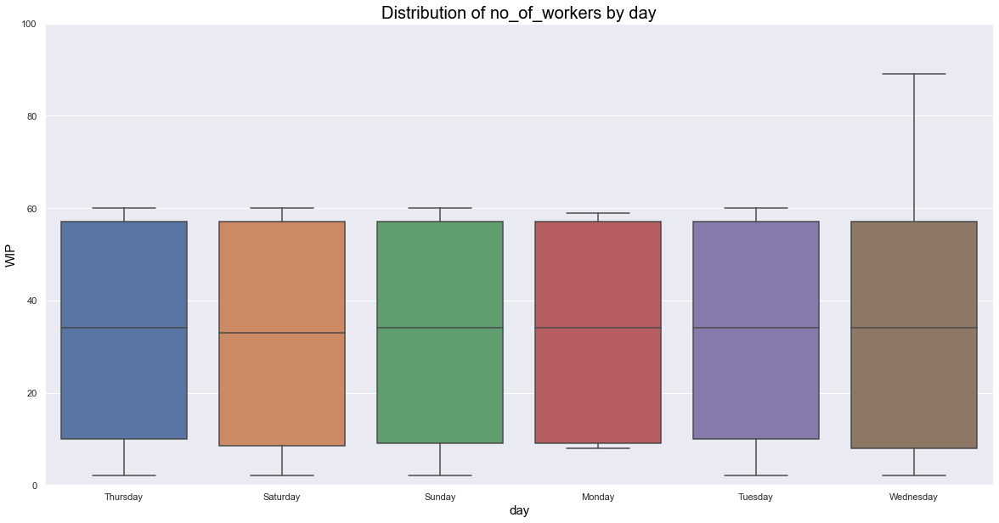

In [39]:
#dayofmonth
sn.set(font_scale=1.0)
temp = master_data_df[["no_of_workers",'day']]
plt.figure(figsize=(20,10))
sn.boxplot(x="day",y="no_of_workers",data=temp)
plt.title("Distribution of no_of_workers by day",fontsize=20, color='black')
plt.ylabel("WIP",fontsize=15, color='black')
plt.ylim(0,100)
plt.xlabel("day",fontsize=15, color='black')

<b>Analysis by time over_time by team</b>

In [40]:
master_data_df.columns

Index(['date', 'quarter', 'department', 'day', 'team', 'targeted_productivity',
       'smv', 'wip', 'over_time', 'incentive', 'idle_time', 'idle_men',
       'no_of_style_change', 'no_of_workers', 'actual_productivity', 'month',
       'year', 'team_department', 'meet_target', 'actual_productivity_type',
       'dayofmonth'],
      dtype='object')

Text(0.5, 0, 'team_department')

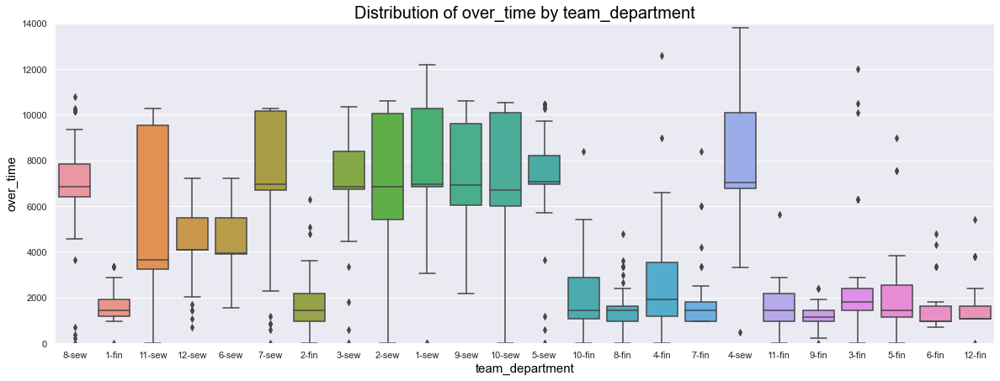

In [41]:
sn.set(font_scale=1.0)
temp = master_data_df[["team_department",'over_time']]
plt.figure(figsize=(20,7))
sn.boxplot(x="team_department",y="over_time",data=temp)
plt.title("Distribution of over_time by team_department",fontsize=20, color='black')
plt.ylabel("over_time",fontsize=15, color='black')
plt.ylim(0,14000)
plt.xlabel("team_department",fontsize=15, color='black')

Text(0.5, 0, 'day')

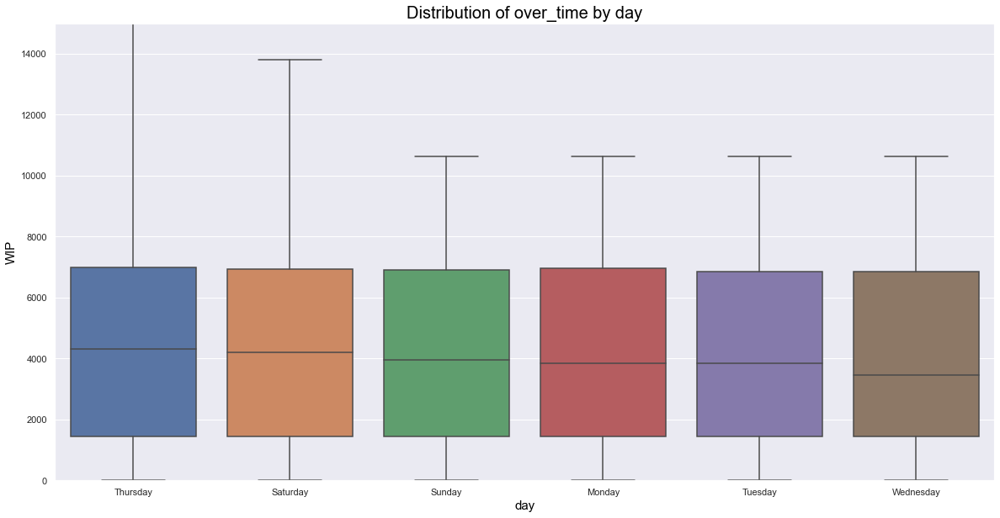

In [42]:
sn.set(font_scale=1.0)
temp = master_data_df[["over_time",'day']]
plt.figure(figsize=(20,10))
sn.boxplot(x="day",y="over_time",data=temp)
plt.title("Distribution of over_time by day",fontsize=20, color='black')
plt.ylabel("WIP",fontsize=15, color='black')
plt.ylim(0,15000)
plt.xlabel("day",fontsize=15, color='black')

Text(0.5, 0, 'dayofmonth')

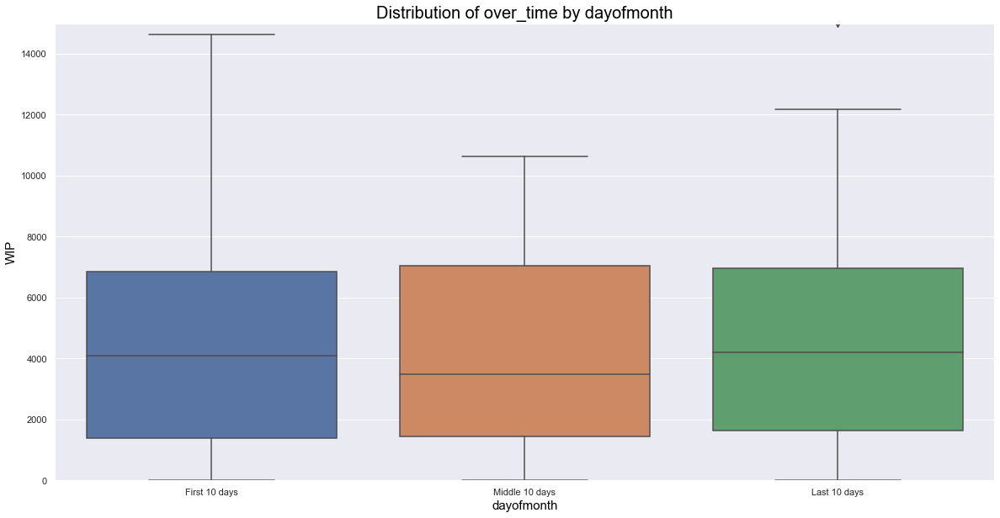

In [43]:
sn.set(font_scale=1.0)
temp = master_data_df[["over_time",'dayofmonth']]
plt.figure(figsize=(20,10))
sn.boxplot(x="dayofmonth",y="over_time",data=temp)
plt.title("Distribution of over_time by dayofmonth",fontsize=20, color='black')
plt.ylabel("WIP",fontsize=15, color='black')
plt.ylim(0,15000)
plt.xlabel("dayofmonth",fontsize=15, color='black')

<b>Analysis by incentive</b>

Text(0.5, 1.0, 'Distribution of incentive by over_time')

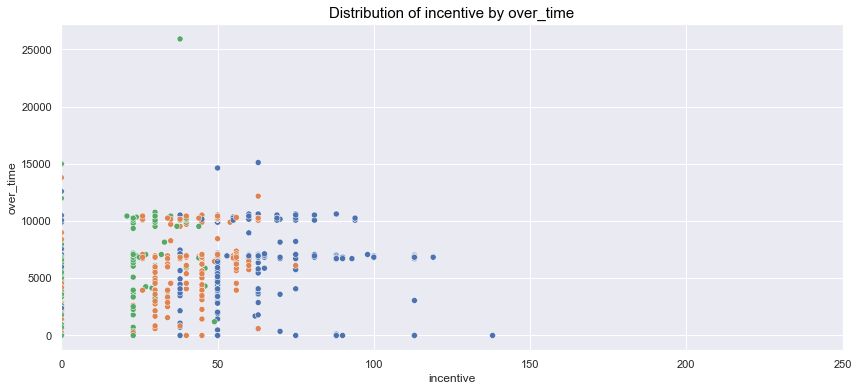

In [44]:
plt.figure(figsize=(14,6))
sn.scatterplot(x="incentive",y="over_time",data=master_data_df,hue="actual_productivity_type", legend=False, sizes=(10, 1000))
plt.xlim(0,250)
plt.title("Distribution of incentive by over_time",fontsize=15, color='black')

Text(0.5, 0, 'team_department')

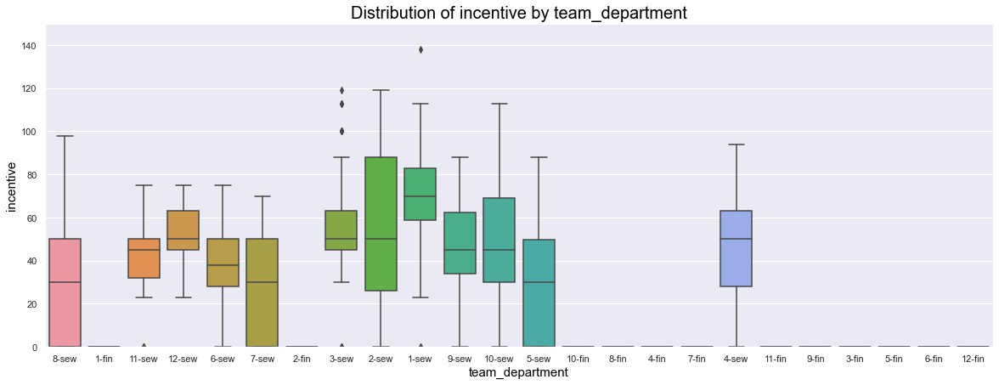

In [45]:
sn.set(font_scale=1.0)
temp = master_data_df[["team_department",'incentive']]
plt.figure(figsize=(20,7))
sn.boxplot(x="team_department",y="incentive",data=temp)
plt.title("Distribution of incentive by team_department",fontsize=20, color='black')
plt.ylabel("incentive",fontsize=15, color='black')
plt.ylim(0,150)
plt.xlabel("team_department",fontsize=15, color='black')

(0.0, 150.0)

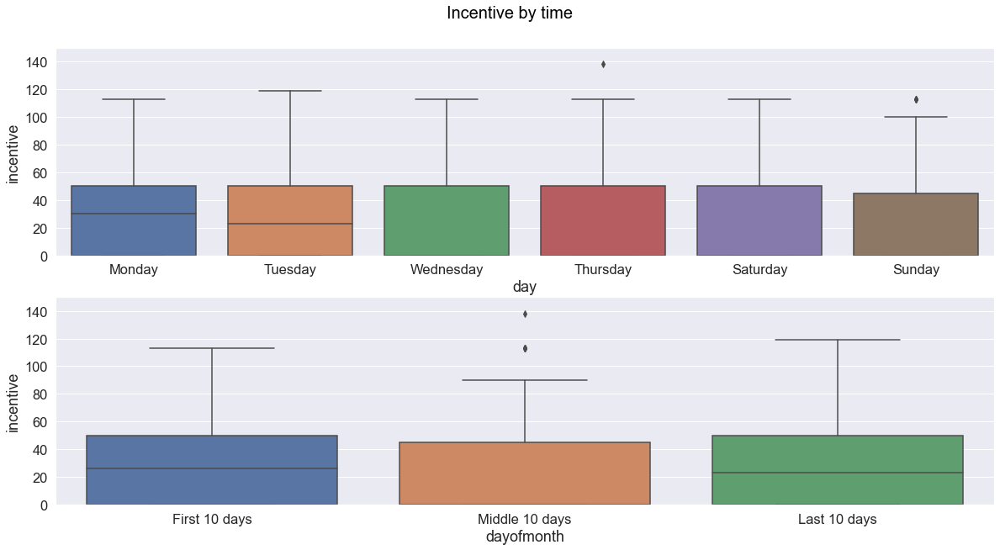

In [46]:
sn.set(font_scale=1.5)
fig, axs = plt.subplots(2,1, figsize=(20,10),sharey =True)
fig.suptitle('Incentive by time',fontsize=20, color='black',y=0.95)
temp = master_data_df[["day",'incentive']]
sn.boxplot(x="day",y="incentive",data=temp,ax=axs[0],order= ["Monday","Tuesday","Wednesday","Thursday","Saturday","Sunday"])
plt.ylim(0,150)
#axs[0].set_title("Day")
sn.set(font_scale=1.0)
temp = master_data_df[["dayofmonth",'incentive']]
sn.boxplot(x="dayofmonth",y="incentive",data=temp,ax=axs[1])
plt.ylim(0,150)
#axs[1].set_title("Day of month")

<b>Analysis by idle_time</b>

In [47]:
def per_cent_of_zero(x,col):
    #print(x)
    var = 1-(x[x[col]==0].count()/(len(x[col])))
    return var*100

Text(0.5, 0, 'team_department')

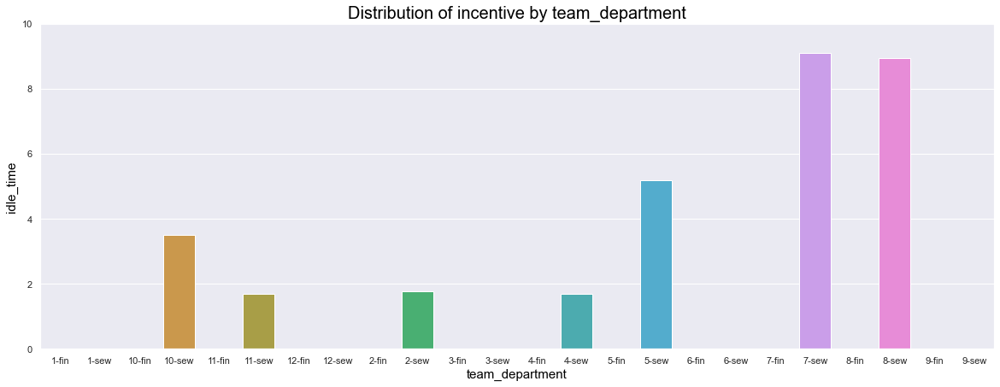

In [48]:
sn.set(font_scale=1.0)
temp = master_data_df[["team_department",'idle_time']]
temp = temp.groupby("team_department",as_index=True).apply(lambda x :per_cent_of_zero(x,"idle_time"))
temp.drop(columns="team_department",inplace=True)
temp=temp.reset_index()
#temp.head(10)
plt.figure(figsize=(20,7))
sn.barplot(x="team_department",y="idle_time",data=temp)
plt.title("Distribution of incentive by team_department",fontsize=20, color='black')
plt.ylabel("idle_time",fontsize=15, color='black')
plt.ylim(0,10)
plt.xlabel("team_department",fontsize=15, color='black')

(0.0, 5.0)

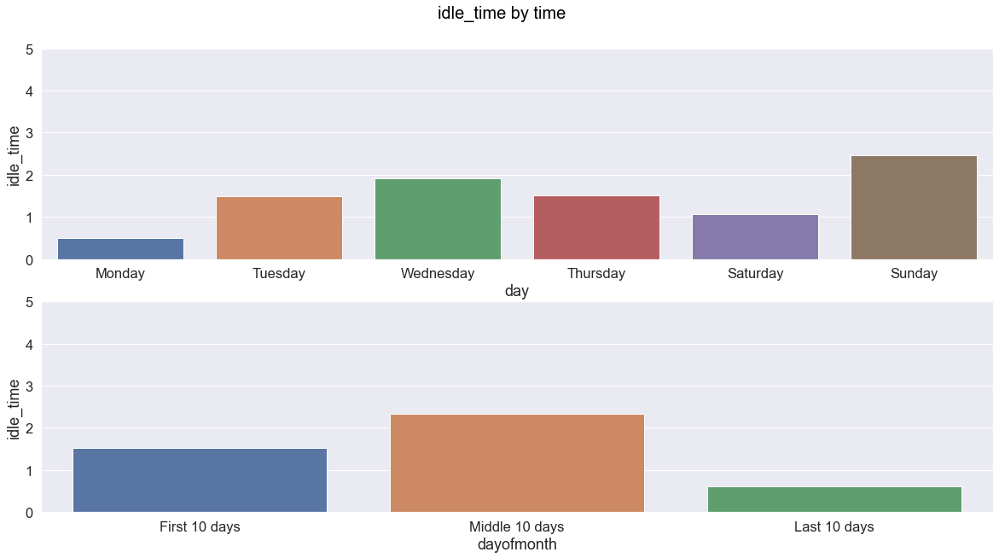

In [49]:
sn.set(font_scale=1.5)
fig, axs = plt.subplots(2,1, figsize=(20,10),sharey =True)
fig.suptitle('idle_time by time',fontsize=20, color='black',y=0.95)
temp = master_data_df[["day",'idle_time']]
temp = temp.groupby("day",as_index=True).apply(lambda x :per_cent_of_zero(x,"idle_time"))
temp.drop(columns="day",inplace=True)
temp=temp.reset_index()
sn.barplot(x="day",y="idle_time",data=temp,ax=axs[0],order= ["Monday","Tuesday","Wednesday","Thursday","Saturday","Sunday"])
plt.ylim(0,5)
#axs[0].set_title("Day")
sn.set(font_scale=1.0)
temp = master_data_df[["dayofmonth",'idle_time']]
temp = temp.groupby("dayofmonth",as_index=True).apply(lambda x :per_cent_of_zero(x,"idle_time"))
temp.drop(columns="dayofmonth",inplace=True)
temp=temp.reset_index()
sn.barplot(x="dayofmonth",y="idle_time",data=temp,ax=axs[1],order=["First 10 days","Middle 10 days","Last 10 days"])
plt.ylim(0,5)

<b>Analysis by idle_men</b>

Text(0.5, 0, 'team_department')

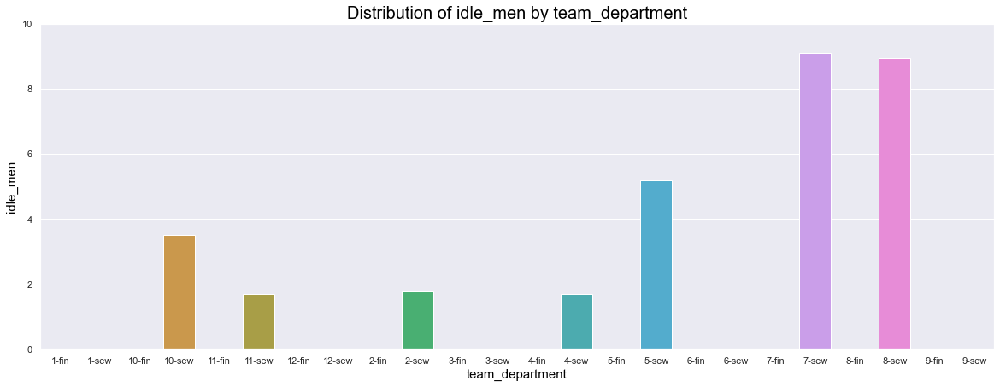

In [50]:
sn.set(font_scale=1.0)
temp = master_data_df[["team_department",'idle_men']]
temp = temp.groupby("team_department",as_index=True).apply(lambda x :per_cent_of_zero(x,"idle_men"))
temp.drop(columns="team_department",inplace=True)
temp=temp.reset_index()
plt.figure(figsize=(20,7))
sn.barplot(x="team_department",y="idle_men",data=temp)
plt.title("Distribution of idle_men by team_department",fontsize=20, color='black')
plt.ylabel("idle_men",fontsize=15, color='black')
plt.ylim(0,10)
plt.xlabel("team_department",fontsize=15, color='black')

(0.0, 5.0)

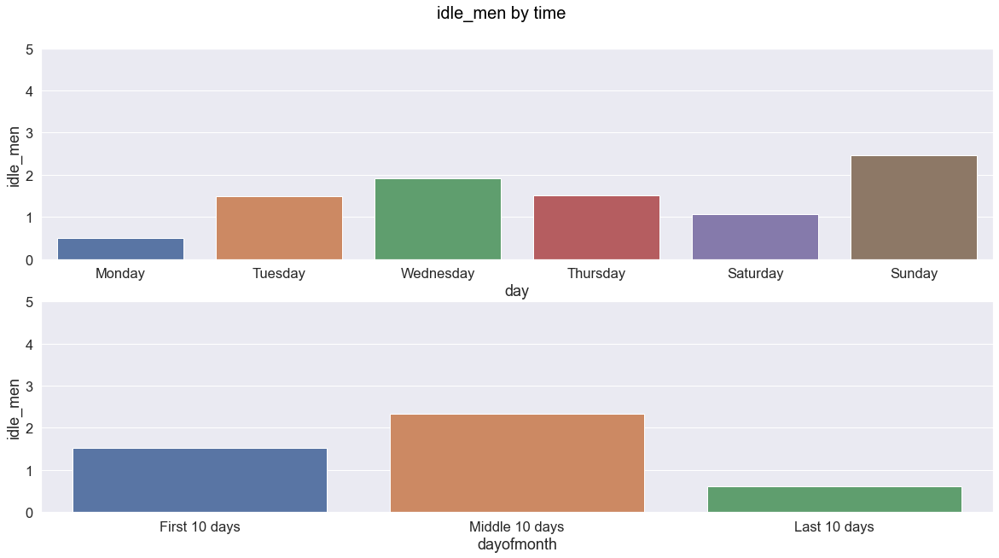

In [51]:
sn.set(font_scale=1.5)
fig, axs = plt.subplots(2,1, figsize=(20,10),sharey =True)
fig.suptitle('idle_men by time',fontsize=20, color='black',y=0.95)
temp = master_data_df[["day",'idle_men']]
temp = temp.groupby("day",as_index=True).apply(lambda x :per_cent_of_zero(x,"idle_men"))
temp.drop(columns="day",inplace=True)
temp=temp.reset_index()
sn.barplot(x="day",y="idle_men",data=temp,ax=axs[0],order= ["Monday","Tuesday","Wednesday","Thursday","Saturday","Sunday"])
plt.ylim(0,5)
#axs[0].set_title("Day")
sn.set(font_scale=1.0)
temp = master_data_df[["dayofmonth",'idle_men']]
temp = temp.groupby("dayofmonth",as_index=True).apply(lambda x :per_cent_of_zero(x,"idle_men"))
temp.drop(columns="dayofmonth",inplace=True)
temp = temp.reset_index()
sn.barplot(x="dayofmonth",y="idle_men",data=temp,ax=axs[1],order=["First 10 days","Middle 10 days","Last 10 days"])
plt.ylim(0,5)

<b>Analaysis by no_of_style_change</b>

Text(0.5, 0, 'team_department')

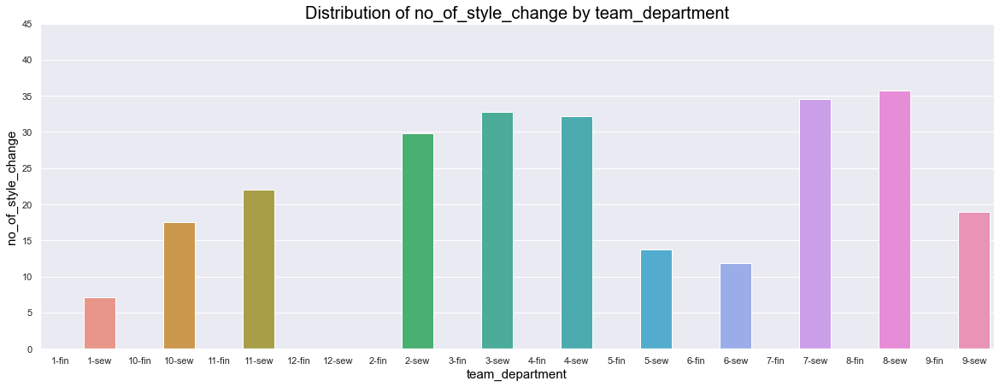

In [52]:
sn.set(font_scale=1.0)
temp = master_data_df[["team_department",'no_of_style_change']]
temp = temp.groupby("team_department",as_index=True).apply(lambda x :per_cent_of_zero(x,"no_of_style_change"))
temp.drop(columns="team_department",inplace=True)
temp=temp.reset_index()
plt.figure(figsize=(20,7))
sn.barplot(x="team_department",y="no_of_style_change",data=temp)
plt.title("Distribution of no_of_style_change by team_department",fontsize=20, color='black')
plt.ylabel("no_of_style_change",fontsize=15, color='black')
plt.ylim(0,45)
plt.xlabel("team_department",fontsize=15, color='black')

        day  no_of_style_change
0    Monday           12.060302
1  Saturday           10.695187


(0.0, 20.0)

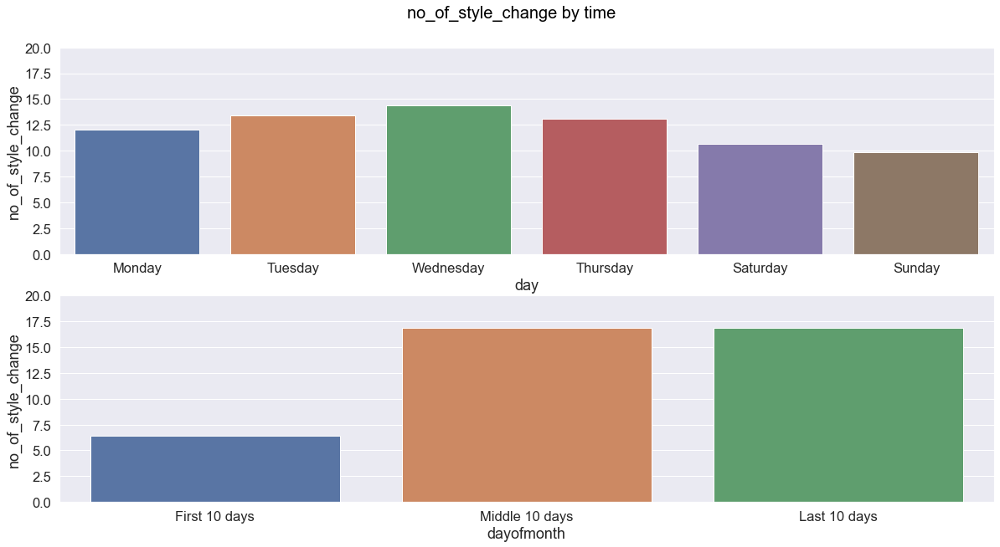

In [53]:
sn.set(font_scale=1.5)
fig, axs = plt.subplots(2,1, figsize=(20,10),sharey =True)
fig.suptitle('no_of_style_change by time',fontsize=20, color='black',y=0.95)
temp = master_data_df[["day",'no_of_style_change']]
temp = temp.groupby("day",as_index=True).apply(lambda x :per_cent_of_zero(x,"no_of_style_change"))
temp.drop(columns="day",inplace=True)
temp=temp.reset_index()
print(temp.head(2))
sn.barplot(x="day",y="no_of_style_change",data=temp,ax=axs[0],order= ["Monday","Tuesday","Wednesday","Thursday","Saturday","Sunday"])
plt.ylim(0,20)
#axs[0].set_title("Day")
sn.set(font_scale=1.0)
temp = master_data_df[["dayofmonth",'no_of_style_change']]
temp = temp.groupby("dayofmonth",as_index=True).apply(lambda x :per_cent_of_zero(x,"no_of_style_change"))
temp.drop(columns="dayofmonth",inplace=True)
temp = temp.reset_index()
sn.barplot(x="dayofmonth",y="no_of_style_change",data=temp,ax=axs[1],order=["First 10 days","Middle 10 days","Last 10 days"])
plt.ylim(0,20)

<b>Observations</b>

In [54]:
master_data_df.columns

Index(['date', 'quarter', 'department', 'day', 'team', 'targeted_productivity',
       'smv', 'wip', 'over_time', 'incentive', 'idle_time', 'idle_men',
       'no_of_style_change', 'no_of_workers', 'actual_productivity', 'month',
       'year', 'team_department', 'meet_target', 'actual_productivity_type',
       'dayofmonth'],
      dtype='object')

### Scaling

In [55]:
temp = master_data_df[['targeted_productivity',
       'smv', 'wip', 'over_time', 'incentive', 'idle_time', 'idle_men',
       'no_of_style_change','no_of_workers']]
col_names = temp.columns
temp1 = master_data_df[['date', 'quarter', 'department', 'day', 'team','month',
       'year', 'team_department', 'meet_target', 'actual_productivity_type',
       'dayofmonth','actual_productivity']]
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(temp)
temp = pd.DataFrame(scaler.transform(temp),columns=col_names)
master_data_df = pd.concat([temp1,temp],axis=1)
master_data_df.head()

,date,quarter,department,day,team,month,year,team_department,meet_target,actual_productivity_type,...,actual_productivity,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers
0,2015-01-01,Quarter1,seweing,Thursday,8,Jan,2015,8-sew,Yes,High,...,0.940725,1.000000,0.450252,0.047920,0.273148,0.027222,0.0,0.0,0.0,0.655172
1,2015-01-01,Quarter1,finishing,Thursday,1,Jan,2015,1-fin,Yes,High,...,0.886500,0.931507,0.020132,0.000000,0.037037,0.000000,0.0,0.0,0.0,0.068966
2,2015-01-01,Quarter1,seweing,Thursday,11,Jan,2015,11-sew,Yes,High,...,0.800570,1.000000,0.164731,0.041865,0.141204,0.013889,0.0,0.0,0.0,0.327586
3,2015-01-01,Quarter1,seweing,Thursday,12,Jan,2015,12-sew,Yes,High,...,0.800570,1.000000,0.164731,0.041865,0.141204,0.013889,0.0,0.0,0.0,0.327586
4,2015-01-01,Quarter1,seweing,Thursday,6,Jan,2015,6-sew,Yes,High,...,0.800382,1.000000,0.445219,0.050601,0.074074,0.013889,0.0,0.0,0.0,0.620690


### Multicollinearity

In [56]:
temp_df = master_data_df[['targeted_productivity', 'smv',
       'wip', 'over_time', 'incentive', 'idle_time', 'idle_men',
       'no_of_style_change', 'no_of_workers']]

In [57]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
temp = pd.DataFrame()
temp["feature"] = temp_df.columns
#calculating VIF for each feature
temp["VIF"] = [variance_inflation_factor(temp_df.values, i) for i in range(len(temp_df.columns))]

In [58]:
temp.head(10)

,feature,VIF
0,targeted_productivity,3.376246
1,smv,13.248235
2,wip,1.415284
3,over_time,6.814286
4,incentive,1.070272
5,idle_time,1.482045
6,idle_men,1.545876
7,no_of_style_change,1.406668
8,no_of_workers,24.236198


Text(0.5, 1.0, 'Correlation Map')

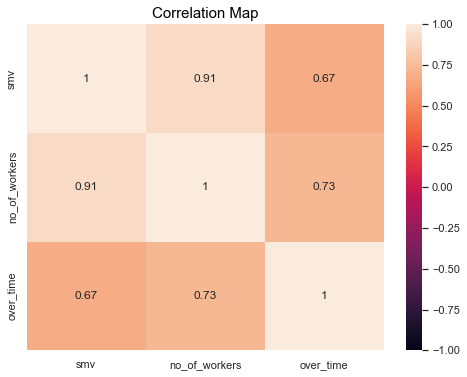

In [59]:
temp = master_data_df[['smv','no_of_workers','over_time']]
plt.figure(figsize=(8,6))
corr = temp.corr()
sn.heatmap(corr,vmin=-1, vmax=1, annot=True)
plt.title("Correlation Map",fontsize=15,color="black")

In [60]:
from sklearn.linear_model import LinearRegression
y = temp['no_of_workers']
X = temp[['smv','over_time']]
reg = LinearRegression().fit(X, y)
print(reg.coef_)
print(reg.intercept_)
reg.score(X,y)
X["no_of_workers_predict"] = reg.predict(X)
master_data_df = pd.concat([master_data_df,X["no_of_workers_predict"]],axis=1)
master_data_df.drop(columns=['smv','over_time','no_of_workers'],inplace=True)
var = "no_of_workers_predict = 0.08206655329999979 + 0.92172199*smv + 0.42993763*over_time"
print(var)

[0.92172199 0.42993763]
0.08206655329999979
no_of_workers_predict = 0.08206655329999979 + 0.92172199*smv + 0.42993763*over_time


In [61]:
temp_df = master_data_df[['targeted_productivity',
       'wip', 'incentive', 'idle_time', 'idle_men',
       'no_of_style_change', 'no_of_workers_predict']]
from statsmodels.stats.outliers_influence import variance_inflation_factor
temp = pd.DataFrame()
temp["feature"] = temp_df.columns
#calculating VIF for each feature
temp["VIF"] = [variance_inflation_factor(temp_df.values, i) for i in range(len(temp_df.columns))]

In [62]:
temp

,feature,VIF
0,targeted_productivity,3.302076
1,wip,1.358851
2,incentive,1.061038
3,idle_time,1.479248
4,idle_men,1.518292
5,no_of_style_change,1.259168
6,no_of_workers_predict,4.062022


### Encoding

In [63]:
dic = {'seweing':1,'finishing':2}
master_data_df['department'] = master_data_df['department'].map(dic)
dic = {'Monday':1,'Tuesday':2,'Wednesday':3,'Thursday':4,'Friday':5,'Saturday':6,'Sunday':7}
master_data_df['day'] = master_data_df['day'].map(dic)
dic = {'Jan':1,'Feb':2,'Mar':3,'Apr':4,'May':5,'Jun':6,'Jul':7,'Aug':8,'Sep':9,'Oct':10,'Nov':11,'Dec':12}
master_data_df['month'] = master_data_df['month'].map(dic)
dayofmonth = {'First 10 days':1,'Middle 10 days':2,'Last 10 days':3}
master_data_df['dayofmonth'] = master_data_df['dayofmonth'].map(dayofmonth)

In [64]:
master_data_encoded = master_data_df[['department','day','team','month','dayofmonth','actual_productivity', 'targeted_productivity', 'wip', 'incentive', 'idle_time','idle_men', 'no_of_style_change', 'no_of_workers_predict','actual_productivity_type']]
master_data_encoded.head()

,department,day,team,month,dayofmonth,actual_productivity,targeted_productivity,wip,incentive,idle_time,idle_men,no_of_style_change,no_of_workers_predict,actual_productivity_type
0,1,4,8,1,1,0.940725,1.000000,0.047920,0.027222,0.0,0.0,0.0,0.614510,High
1,2,4,1,1,1,0.886500,0.931507,0.000000,0.000000,0.0,0.0,0.0,0.116546,High
2,1,4,11,1,1,0.800570,1.000000,0.041865,0.013889,0.0,0.0,0.0,0.294611,High
3,1,4,12,1,1,0.800570,1.000000,0.041865,0.013889,0.0,0.0,0.0,0.294611,High
4,1,4,6,1,1,0.800382,1.000000,0.050601,0.013889,0.0,0.0,0.0,0.524282,High


In [65]:
master_data_encoded.to_csv("garments_worker_productivity_encoded_feature engineering.csv",index=False)
writer.save()

### Tree Based Analysis

In [69]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
clf = DecisionTreeClassifier(max_depth = 3, 
                             random_state = 0)
X_train = master_data_df[['department','day','team','month','dayofmonth', 'targeted_productivity', 'wip', 'incentive', 'idle_time','idle_men', 'no_of_style_change', 'no_of_workers_predict']]
Y_train = master_data_df['actual_productivity_type']
# Step 3: Train the model on the data
clf.fit(X_train, Y_train)
# Step 4: Predict labels of unseen (test) data
# Not doing this step in the tutorial
clf.predict(X_train)
#tree.plot_tree(clf)
fn=['department','day','team','month','dayofmonth', 'targeted_productivity', 'wip', 'incentive', 'idle_time','idle_men', 'no_of_style_change', 'no_of_workers_predict']
cn=['High',"Mid","Low"]
#fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (6,4), dpi=600)
#tree.plot_tree(clf,feature_names = fn, class_names=cn,filled = True);
#fig.savefig('imagename.png')

One Hot Encoding Target Variable

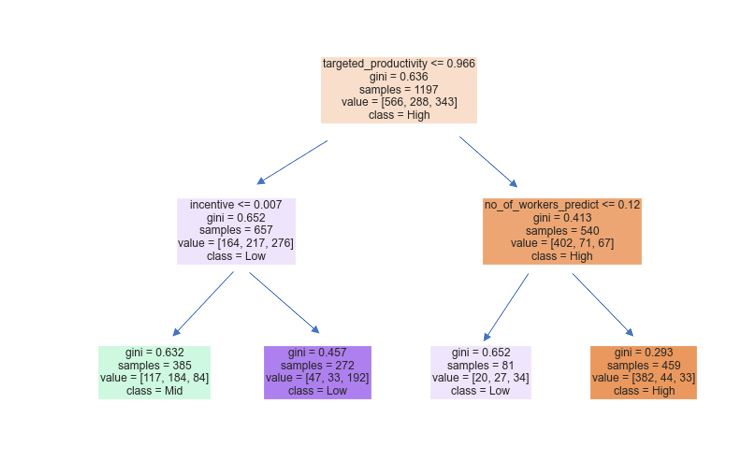

<b>Test Data Into Test and Train</b>

In [186]:
X = master_data_df.drop(columns="actual_productivity_type")
y = master_data_df['actual_productivity_type']
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)
X_train = X_train[['department','day','team','month','dayofmonth', 'targeted_productivity', 'wip', 'incentive', 'idle_time','idle_men', 'no_of_style_change', 'no_of_workers_predict']]
final_tmp = X_test.copy()
X_test = X_test[['department','day','team','month','dayofmonth', 'targeted_productivity', 'wip', 'incentive', 'idle_time','idle_men', 'no_of_style_change', 'no_of_workers_predict']]
print(X_train.shape)
print(y_train.shape)

(837, 12)
(837,)


In [89]:
from sklearn.model_selection import GridSearchCV
def mape(X,col):
    X = X.copy()
    X['err'] = abs(X['actual productivity'] - X[col])
    return X['err'].sum()/X['actual productivity'].sum()*100

# Prediction
def Prediction(model):
    pred_prob = pd.DataFrame(model.predict_proba(X_test))
    pred = pd.DataFrame(model.predict(X_test))
    pred = pd.concat([y_test,pred_prob,pred],axis=1, ignore_index=True)
    pred.columns = ['Actual','High','Mid','Low', 'Y_pred']
    return(pred)

<b>LINEAR MODEL</b>

https://medium.com/dataman-in-ai/a-wide-choice-for-modeling-multi-class-classifications-d97073ff4ec8<br>
http://www.pycaret.org/tutorials/html/MCLF101.html

<b>Logistic regression</b>

In [87]:
from sklearn.linear_model import LogisticRegression

import warnings
warnings.filterwarnings('ignore')

# Modeling
LM_model = LogisticRegression(multi_class='ovr', solver='liblinear')
# parameter grid
parameters = {
    'penalty' : ['l1','l2'], 
    'C'       : np.logspace(-3,3,7),
    'solver'  : ['newton-cg', 'lbfgs', 'liblinear','softmax'],
}

LM_model = GridSearchCV(estimator=LM_model,param_grid=parameters,cv=5,scoring='accuracy')
LM_model.fit(X_train, y_train)
lm_pred = Prediction(LM_model)  

# Actual vs. Prediction
pd.crosstab(lm_pred['Y_pred'],lm_pred['Actual']).apply(lambda x: x/x.sum(), axis=1).round(2)

Actual,High,Low,Mid
Y_pred,,,
High,0.57,0.16,0.27
Low,0.52,0.17,0.30
Mid,0.38,0.15,0.46


<b>Decision tree</b>

In [96]:
from sklearn.tree import DecisionTreeClassifier
params = {'max_leaf_nodes': list(range(2, 100)), 'min_samples_split': [2, 3, 4],'max_depth':[5,6,7,8]}
grid_search_cv = GridSearchCV(DecisionTreeClassifier(random_state=42), params, verbose=1, cv=5)

grid_search_cv.fit(X_train, y_train)
lm_pred = Prediction(grid_search_cv)  

# Actual vs. Prediction
pd.crosstab(lm_pred['Y_pred'],lm_pred['Actual']).apply(lambda x: x/x.sum(), axis=1).round(2)

Fitting 5 folds for each of 1176 candidates, totalling 5880 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 5880 out of 5880 | elapsed:   57.3s finished


Actual,High,Low,Mid
Y_pred,,,
High,0.56,0.18,0.26
Low,0.50,0.12,0.38
Mid,0.53,0.18,0.29


<b>KNN</b>

In [110]:
from sklearn.neighbors import KNeighborsClassifier
param_grid = {'n_neighbors':[1,2,3,4,5,6,7,8,9]}
grid = GridSearchCV(estimator=KNeighborsClassifier(),param_grid=param_grid,cv=5, scoring='accuracy', verbose=0, n_jobs=-1)
grid.fit(X_train,y_train)
lm_pred = Prediction(grid)  

# Actual vs. Prediction
pd.crosstab(lm_pred['Y_pred'],lm_pred['Actual']).apply(lambda x: x/x.sum(), axis=1).round(2)

Actual,High,Low,Mid
Y_pred,,,
High,0.53,0.16,0.31
Low,0.52,0.19,0.30
Mid,0.71,0.14,0.14


<b>Random Forest</b>

In [114]:
from sklearn.ensemble import RandomForestClassifier
# Instantiate the model
rf_model = RandomForestClassifier(random_state=42)
param_grid = {
'n_estimators': [50, 100, 200, 300],
'min_samples_leaf': [1, 5, 10],
'max_depth': [2, 4, 6, 8, 10],
'max_features': ['auto', 'sqrt'],
'bootstrap': [True, False]}
# Instantiate GridSearchCV
model_gridsearch = GridSearchCV(
estimator=rf_model,
param_grid=param_grid,
scoring='accuracy',
n_jobs=4,
cv=5,
refit=True,
return_train_score=True)
model_gridsearch.fit(X_train, y_train)
lm_pred = Prediction(model_gridsearch)  

# Actual vs. Prediction
pd.crosstab(lm_pred['Y_pred'],lm_pred['Actual']).apply(lambda x: x/x.sum(), axis=1).round(2)

Actual,High,Low,Mid
Y_pred,,,
High,0.53,0.20,0.27
Low,0.48,0.13,0.39
Mid,0.59,0.12,0.28


<b>LGB</b>

In [ ]:
import lightgbm as lgb
lgb=lgb.LGBMClassifier()
#Define the parameters
parameters = {'num_leaves':[20,40,60,80,100], 'min_child_samples':[5,10,15],'max_depth':[-1,5,10,20],
             'learning_rate':[0.05,0.1,0.2],'reg_alpha':[0,0.01,0.03]}
#Define the scoring
clf=GridSearchCV(lgb,parameters,scoring='accuracy',n_jobs=4,
cv=5,
refit=True,
return_train_score=True)
clf.fit(X=X_train, y=y_train)
lm_pred = Prediction(clf)  

# Actual vs. Prediction
pd.crosstab(lm_pred['Y_pred'],lm_pred['Actual']).apply(lambda x: x/x.sum(), axis=1).round(2)

<b>Xgboost</b>

In [137]:
dic = {'High':0,'Mid':1,'Low':2}
dic_rev = {0:'High',1:'Mid',2:'Low'}
y_train_sav = y_train.map(dic)
from xgboost import XGBClassifier
params = {
        'learning_rate':[0.02,0.1,0.002,0.5],
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

xgb = XGBClassifier(random_state=42,silent=True, nthread=1,objective='multi:softproba',tree_method="hist")

gridsearch = GridSearchCV(xgb, param_grid=params, scoring='accuracy', n_jobs=4, cv=5)
gridsearch.fit(X=X_train, y=y_train_sav)
lm_pred = Prediction(gridsearch) 

[16:03:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




In [138]:
lm_pred['Y_pred'] = lm_pred['Y_pred'].map(dic_rev)
# Actual vs. Prediction
pd.crosstab(lm_pred['Y_pred'],lm_pred['Actual']).apply(lambda x: x/x.sum(), axis=1).round(2)

Actual,High,Low,Mid
Y_pred,,,
High,0.54,0.18,0.28
Low,0.54,0.12,0.35
Mid,0.54,0.18,0.29


<b>Neural Network</b>

In [143]:
from sklearn.neural_network import MLPClassifier
parameter_space = {
    'hidden_layer_sizes': [(10,30,10),(20,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05,0.5,1],
    'learning_rate': ['constant','adaptive'],
}
NN_model = MLPClassifier(random_state=1, max_iter=300)
grid = GridSearchCV(estimator=NN_model,param_grid=parameter_space,cv=5,scoring='accuracy', n_jobs=4)
grid.fit(X_train,y_train)
NN_pred = Prediction(grid)    
pd.crosstab(NN_pred['Y_pred'],NN_pred['Actual']).apply(lambda x: x/x.sum(), axis=1).round(2)

Actual,High,Low,Mid
Y_pred,,,
High,0.58,0.17,0.25
Low,0.52,0.16,0.32
Mid,0.31,0.15,0.54


<b>Naive Bayes</b>

In [144]:
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import GaussianNB
NB_model = GaussianNB().fit(X_train,y_train)
NB_pred = Prediction(NB_model)    
pd.crosstab(NB_pred['Y_pred'],NB_pred['Actual']).apply(lambda x: x/x.sum(), axis=1).round(2)

Actual,High,Low,Mid
Y_pred,,,
High,0.55,0.16,0.29
Low,0.50,0.25,0.25
Mid,0.50,0.14,0.36


<b>LDA</b>

In [147]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
disc_model = LinearDiscriminantAnalysis().fit(X_train,y_train)
disc_pred = Prediction(disc_model)    
pd.crosstab(disc_pred['Y_pred'],disc_pred['Actual']).apply(lambda x: x/x.sum(), axis=1).round(2)

Actual,High,Low,Mid
Y_pred,,,
High,0.54,0.17,0.29
Low,0.57,0.14,0.29
Mid,0.50,0.19,0.31


<b>AUTOML</b>

In [157]:
import pycaret
from pycaret.classification import *
X_train_automl = X_train.copy()
X_train_automl['actual_productivity_type'] = y_train
#X_train_automl['actual_productivity_type'] = X_train_automl['actual_productivity_type'].map(dic)
reg = setup(data = X_train_automl, target = 'actual_productivity_type')

,Description,Value
0,session_id,1591
1,Target,actual_productivity_type
2,Target Type,Multiclass
3,Label Encoded,"High: 0, Low: 1, Mid: 2"
4,Original Data,"(837, 13)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,5
8,Ordinal Features,False
9,High Cardinality Features,False


In [159]:
compare_models(sort = 'Recall')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.7421,0.9016,0.7073,0.7488,0.7384,0.5920,0.5969,0.0550
rf,Random Forest Classifier,0.7471,0.9048,0.7032,0.7450,0.7388,0.5933,0.5999,0.2420
gbc,Gradient Boosting Classifier,0.7333,0.8932,0.6974,0.7314,0.7282,0.5763,0.5800,0.1710
xgboost,Extreme Gradient Boosting,0.7300,0.8989,0.6920,0.7320,0.7254,0.5724,0.5766,0.1440
et,Extra Trees Classifier,0.7162,0.8702,0.6759,0.7147,0.7073,0.5478,0.5541,0.2240
dt,Decision Tree Classifier,0.6938,0.7684,0.6599,0.6986,0.6923,0.5192,0.5223,0.0170
ada,Ada Boost Classifier,0.6222,0.7806,0.5933,0.6329,0.6227,0.4097,0.4128,0.0530
lda,Linear Discriminant Analysis,0.6000,0.7644,0.5530,0.5973,0.5879,0.3552,0.3607,0.0170
knn,K Neighbors Classifier,0.6171,0.7856,0.5487,0.6028,0.5941,0.3700,0.3819,0.0660
lr,Logistic Regression,0.5949,0.7561,0.5436,0.5916,0.5816,0.3431,0.3500,0.0290


LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=1591, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [164]:
CBR = create_model('lightgbm')
tuned_lightgbm = tune_model(CBR,n_iter=50)
print(tuned_lightgbm)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6949,0.8711,0.6331,0.6764,0.6808,0.5070,0.5118
1,0.7119,0.8927,0.6986,0.7328,0.7107,0.5488,0.5566
2,0.7458,0.9109,0.6970,0.7478,0.7443,0.5988,0.6007
3,0.7119,0.9096,0.6746,0.7054,0.7064,0.5426,0.5444
4,0.6610,0.8917,0.6554,0.6929,0.6708,0.4827,0.4881
5,0.7931,0.9071,0.7530,0.7946,0.7876,0.6625,0.6692
6,0.8276,0.9548,0.8234,0.8298,0.8262,0.7323,0.7347
7,0.7414,0.9098,0.6952,0.7398,0.7396,0.5940,0.5949
8,0.7586,0.9026,0.7263,0.7539,0.7553,0.6182,0.6192
9,0.7241,0.8805,0.6829,0.7234,0.7213,0.5649,0.5668


LGBMClassifier(bagging_fraction=1.0, bagging_freq=5, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.6,
               importance_type='split', learning_rate=0.15, max_depth=-1,
               min_child_samples=41, min_child_weight=0.001, min_split_gain=0,
               n_estimators=220, n_jobs=-1, num_leaves=10, objective=None,
               random_state=1591, reg_alpha=0.05, reg_lambda=0.2, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


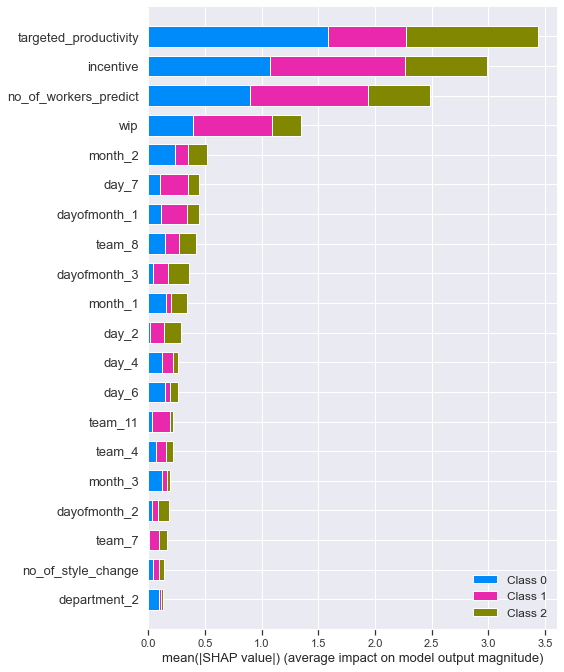

In [165]:
interpret_model(tuned_lightgbm)

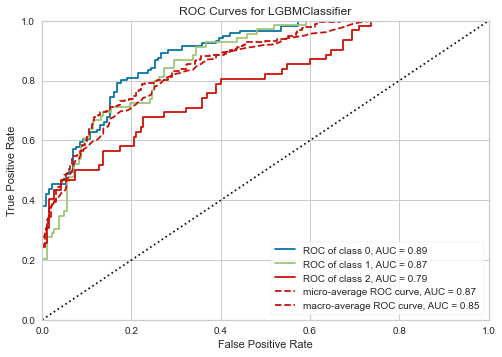

In [166]:
plot_model(tuned_lightgbm)

In [169]:
final_tuned_lightgbm = finalize_model(tuned_lightgbm)

In [176]:
unseen_predictions = predict_model(final_tuned_lightgbm, data=X_test)
pred = pd.concat([y_test,unseen_predictions['Label']],axis=1, ignore_index=True)
pred.columns = ['Actual','Pred']
pd.crosstab(pred['Pred'],pred['Actual']).apply(lambda x: x/x.sum(), axis=1).round(2)

Actual,High,Low,Mid
Pred,,,
High,0.81,0.08,0.11
Low,0.17,0.60,0.23
Mid,0.14,0.14,0.72


<b>Blend</b>

In [177]:
reg = setup(data = X_train_automl, target = 'actual_productivity_type')

top3 = compare_models(n_select = 3) 

blender = blend_models(top3) 

blender

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7119,0.8567,0.6835,0.7140,0.7077,0.5374,0.5416
1,0.7288,0.8983,0.7030,0.7288,0.7288,0.5740,0.5740
2,0.7627,0.9160,0.7488,0.7741,0.7645,0.6319,0.6353
3,0.7458,0.8578,0.7318,0.7673,0.7467,0.6026,0.6095
4,0.7797,0.9223,0.7353,0.7825,0.7730,0.6411,0.6500
5,0.7759,0.9190,0.7293,0.7798,0.7663,0.6365,0.6491
6,0.7759,0.9043,0.7406,0.7701,0.7704,0.6465,0.6487
7,0.7586,0.8995,0.7452,0.7603,0.7582,0.6213,0.6222
8,0.6724,0.8516,0.6086,0.6528,0.6575,0.4745,0.4791
9,0.6552,0.8486,0.6218,0.6496,0.6456,0.4518,0.4561


VotingClassifier(estimators=[('rf',
                              RandomForestClassifier(bootstrap=True,
                                                     ccp_alpha=0.0,
                                                     class_weight=None,
                                                     criterion='gini',
                                                     max_depth=None,
                                                     max_features='auto',
                                                     max_leaf_nodes=None,
                                                     max_samples=None,
                                                     min_impurity_decrease=0.0,
                                                     min_impurity_split=None,
                                                     min_samples_leaf=1,
                                                     min_samples_split=2,
                                                     min_weight_fraction_leaf=0.0,
        

In [180]:
unseen_predictions = predict_model(blender, data=X_test)
pred = pd.concat([y_test,unseen_predictions['Label']],axis=1, ignore_index=True)
pred.columns = ['Actual','Pred']
pd.crosstab(pred['Pred'],pred['Actual']).apply(lambda x: x/x.sum(), axis=1).round(2)

Actual,High,Low,Mid
Pred,,,
High,0.80,0.09,0.11
Low,0.15,0.56,0.30
Mid,0.14,0.12,0.74


<b> Post Modelling Analysis</b>

In [187]:
unseen_predictions = predict_model(final_tuned_lightgbm, data=X_test)
final_tmp = pd.concat([final_tmp,unseen_predictions['Label'],y_test],axis=1)
final_tmp.head(1)
final_tmp.rename(columns={'Label':'Predicted'},inplace=True)

,date,quarter,department,day,team,month,year,team_department,meet_target,dayofmonth,actual_productivity,targeted_productivity,wip,incentive,idle_time,idle_men,no_of_style_change,no_of_workers_predict,Label,actual_productivity_type
921,2015-02-24,Quarter4,1,2,1,2,2015,1-sew,No,3,0.268214,0.726027,0.03062,0.0,0.0,0.0,0.5,0.515906,Low,Low


Text(0.5, 0, 'team-department')

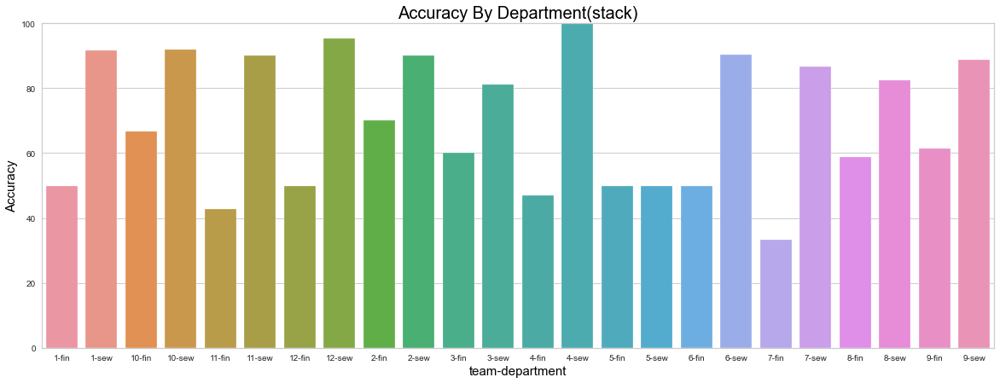

In [215]:
from sklearn.metrics import accuracy_score

temp = pd.DataFrame(final_tmp.groupby("team_department",as_index=False).apply(lambda x :accuracy_score(x['actual_productivity_type'],x['Predicted'])*100))
temp.columns = ['team-department','Accuracy']
plt.figure(figsize=(20,7))
sn.barplot(x="team-department",y="Accuracy",data=temp)
plt.title("Accuracy By Department(stack)",fontsize=20, color='black')
plt.ylabel("Accuracy",fontsize=15, color='black')
plt.ylim(0,100)
plt.xlabel("team-department",fontsize=15, color='black')

Text(0.5, 0, 'quarter')

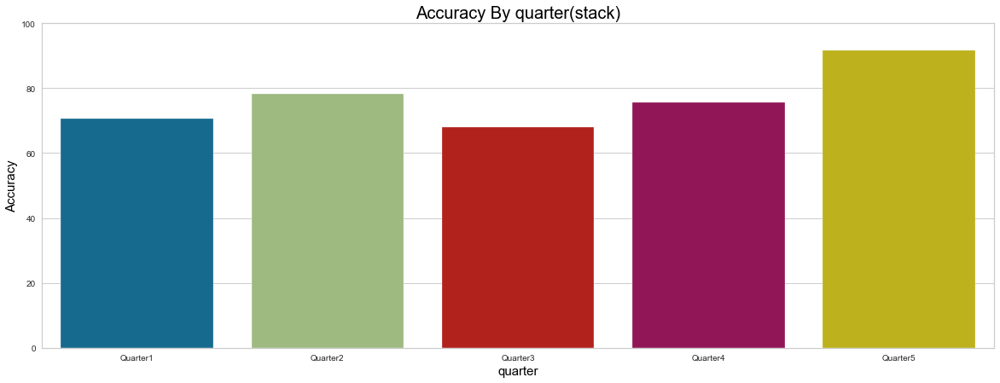

In [219]:
temp = pd.DataFrame(final_tmp.groupby("quarter",as_index=False).apply(lambda x :accuracy_score(x['actual_productivity_type'],x['Predicted'])*100))
temp.columns = ['quarter','Accuracy']
plt.figure(figsize=(20,7))
sn.barplot(x="quarter",y="Accuracy",data=temp)
plt.title("Accuracy By quarter(stack)",fontsize=20, color='black')
plt.ylabel("Accuracy",fontsize=15, color='black')
plt.ylim(0,100)
plt.xlabel("quarter",fontsize=15, color='black')

Text(0.5, 0, 'department')

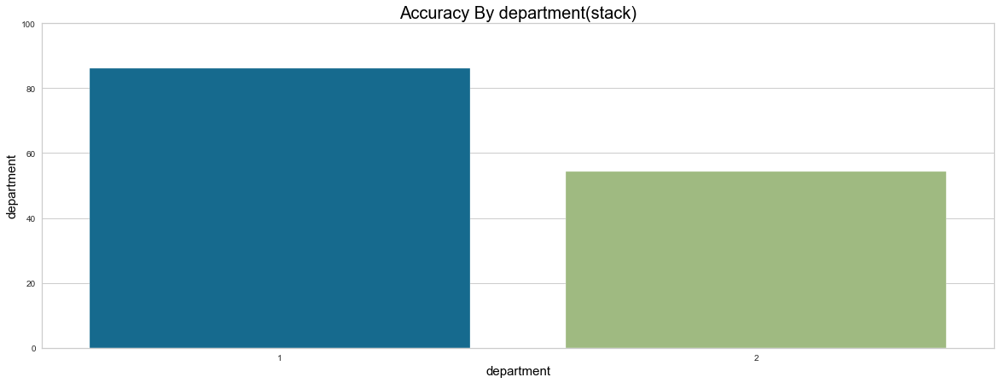

In [220]:
temp = pd.DataFrame(final_tmp.groupby("department",as_index=False).apply(lambda x :accuracy_score(x['actual_productivity_type'],x['Predicted'])*100))
temp.columns = ['department','Accuracy']
plt.figure(figsize=(20,7))
sn.barplot(x="department",y="Accuracy",data=temp)
plt.title("Accuracy By department(stack)",fontsize=20, color='black')
plt.ylabel("department",fontsize=15, color='black')
plt.ylim(0,100)
plt.xlabel("department",fontsize=15, color='black')

Text(0.5, 0, 'team')

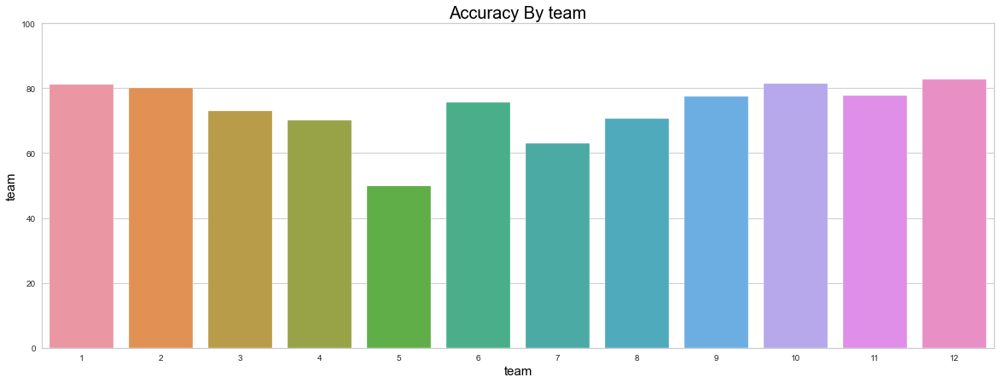

In [222]:
temp = pd.DataFrame(final_tmp.groupby("team",as_index=False).apply(lambda x :accuracy_score(x['actual_productivity_type'],x['Predicted'])*100))
temp.columns = ['team','Accuracy']
plt.figure(figsize=(20,7))
sn.barplot(x="team",y="Accuracy",data=temp)
plt.title("Accuracy By team",fontsize=20, color='black')
plt.ylabel("team",fontsize=15, color='black')
plt.ylim(0,100)
plt.xlabel("team",fontsize=15, color='black')

Text(0.5, 0, 'day')

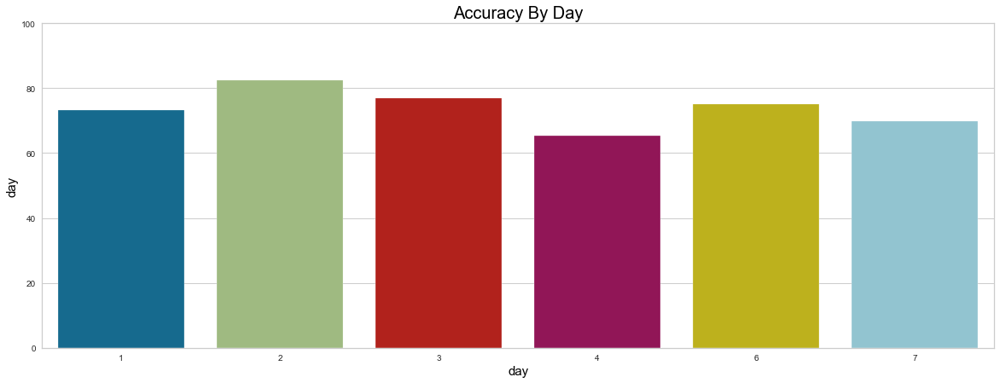

In [223]:
temp = pd.DataFrame(final_tmp.groupby("day",as_index=False).apply(lambda x :accuracy_score(x['actual_productivity_type'],x['Predicted'])*100))
temp.columns = ['day','Accuracy']
plt.figure(figsize=(20,7))
sn.barplot(x="day",y="Accuracy",data=temp)
plt.title("Accuracy By Day",fontsize=20, color='black')
plt.ylabel("day",fontsize=15, color='black')
plt.ylim(0,100)
plt.xlabel("day",fontsize=15, color='black')

Text(0.5, 0, 'month')

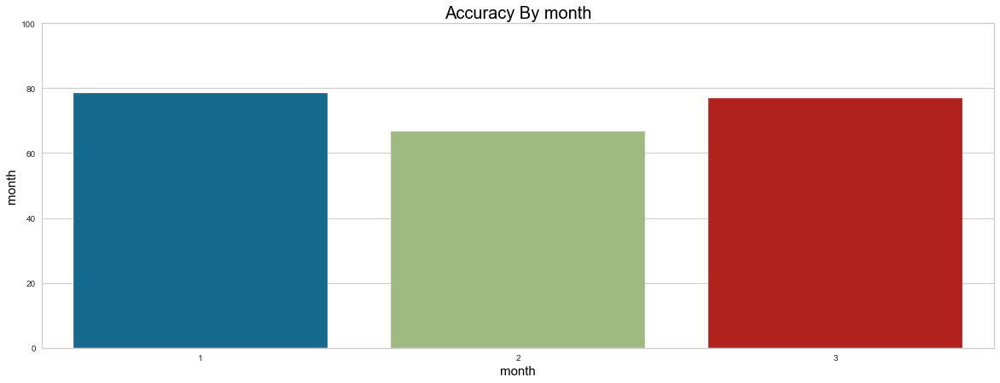

In [224]:
temp = pd.DataFrame(final_tmp.groupby("month",as_index=False).apply(lambda x :accuracy_score(x['actual_productivity_type'],x['Predicted'])*100))
temp.columns = ['month','Accuracy']
plt.figure(figsize=(20,7))
sn.barplot(x="month",y="Accuracy",data=temp)
plt.title("Accuracy By month",fontsize=20, color='black')
plt.ylabel("month",fontsize=15, color='black')
plt.ylim(0,100)
plt.xlabel("month",fontsize=15, color='black')

<b>Conclusion</b>